# <center>  Spread Visualization and Prediction of the Novel Coronavirus Disease COVID-19 Using Machine Learning </center>
#### <center> by Zahra Taheri - July 2020 </center>
 
<center> <img  src=https://wineamerica.org/wp-content/uploads/2020/03/Covid-19-Atlantic.jpeg width="400"/></center>
    
<center>image source: https://wineamerica.org/wp-content/uploads/2020/03/Covid-19-Atlantic.jpeg</center>
 

 <br>
 
The current destructive pandemic of coronavirus disease 2019 (COVID-19), caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2) [[1]](https://www.who.int/emergencies/diseases/novel-coronavirus-2019/technical-guidance/naming-the-coronavirus-disease-(covid-2019)-and-the-virus-that-causes-it), was first reported in Wuhan, China, in December 2019 [[2]](https://www.who.int/csr/don/12-january-2020-novel-coronavirus-china/en/). The outbreak has affected millions of people around the world and the number of infections and mortalities has been growing at an alarming rate. In such a situation, forecasting and proper study of the pattern of disease spread can inspire design better strategies to make more efficient decisions. Moreover, such studies play an important role in achieving accurate predictions. 

Machine learning has numerous tools  that can be used for visualization and prediction, and nowadays it is used worldwide for study of the pattern of COVID-19 spread. One of the main focus of the study in this project is to use machine learning techniques to analyze and visualize the spreading of the virus country-wise as well as globally during a specific period of time by considering confirmed cases, recovered cases and fatalities.

The global impact of the outbreak on various aspects of life has been the focus of many studies. On the other hand, a pandemic can be forecast by considering a variety of parameters such as the impact of environmental factors, quarantine, age, gender and a lot more. 

The forecasting accuracy depends on the availability of proper data to base its predictions and provide an estimate of uncertainty. A challenge to use machine learning techniques for the current outbreak is that the datasets are not yet standardized by any standardization organization and the statistical anomalies are not considered. Also, the appropriate selection of parameters and the selection of the best machine learning model for prediction are other challenges involved in training a model. 

In this project, we are going to perform Linear regression, Support vector machine, Multilayer perceptron, Ensemble methods, etc., on the Johns Hopkins University's COVID-19 data to anticipate the future effects of COVID-19 pandemic in Iran and some other countries. Moreover, we are going to study the impact of some parameters such as geographic conditions, economic statistics, population statistics, life expectancy, etc., in prediction of COVID-19 spread.
<br>

- Data sources: 
    - [COVID-19 datasets from Johns Hopkins University](https://github.com/CSSEGISandData/COVID-19)
    - [World-happiness dataset from Kaggle](https://www.kaggle.com/unsdsn/world-happiness?select=2019.csv)
    - [Population by country - 2020 from Kaggle](https://www.kaggle.com/tanuprabhu/population-by-country-2020)
- More information: [World Health Organization (WHO)](https://www.who.int/emergencies/diseases/novel-coronavirus-2019)
- My contact Info: 
    - https://github.com/zata213/
    - zahra.taheri518@gmail.com 


## Current date and time

In [1]:
from datetime import datetime

print(datetime.now())

2020-07-22 16:15:43.992808


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Some installations to show plotly in the Jupyter lab

In [3]:
#%pip install nodejs

#%pip install jupyterlab "ipywidgets>=7.5"

#%pip install npm

# JupyterLab renderer support
#!jupyter labextension install jupyterlab-plotly@4.8.2

In [4]:
%pip install pycountry

In [5]:
# define a function to display plotly in notebook without above installations

def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))


# paste the following line at the begining of the cell containing plotly

#configure_plotly_browser_state()

## Some other installations

In [6]:
#%pip install statsmodels

#%pip install pystan

#%pip install fbprophet

## Import some libraries

In [7]:
# for dataset handeling and calculations
import numpy as np 
import pandas as pd 

# for basic visualizations
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.dates as mdates
%matplotlib inline 

# for advanced visualizations
import seaborn as sns

# for interactive visualizations
import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# for offline ploting 
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

# to hide warnings
import warnings
warnings.filterwarnings('ignore')

# for date and time operations
from datetime import datetime,timedelta

# for file and folder operations
import os

# for modelling
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OrdinalEncoder
from statsmodels.tsa.arima_model import ARIMA
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, add_changepoints_to_plot
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow import keras

np.random.seed(42)
tf.random.set_seed(42)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Path to the files directory

In [8]:
path = os.getcwd()

if os.path.exists(path+"\data")==False:
    print("Make file directory!")
    os.mkdir(path+"\data")

mypath = path+"\data"

In [9]:
# path to the directory
 
os.chdir(mypath)

print(os.getcwd())

/content\data


## Read datasets

In [10]:
# read files from hard drive

#confirmed_df = pd.read_csv('confirmed_df.csv')
#recovered_df=pd.read_csv('recovered_df.csv')
#deaths_df=pd.read_csv('deaths_df.csv')

In [11]:
# remove all '*.csv' files in the current directory
import glob
for file in glob.glob("*.csv"):
    os.remove(file)

# read files from url
download_root='https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/'

confirmed_df = pd.read_csv(download_root+"time_series_covid19_confirmed_global.csv")
recovered_df=pd.read_csv(download_root+"time_series_covid19_recovered_global.csv")
deaths_df=pd.read_csv(download_root+"time_series_covid19_deaths_global.csv")

# save datasets as '*.csv' file 
confirmed_df.to_csv('confirmed_df.csv', index=False)
recovered_df.to_csv('recovered_df.csv', index=False)
deaths_df.to_csv('deaths_df.csv', index=False)

In [12]:
confirmed_df.head(3)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,...,23546,24102,24766,25527,26310,26874,27532,27878,28424,28833,29157,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022,32324,32672,32951,33190,33384,33594,33908,34194,34366,34451,34455,34740,34994,35070,35229,35301,35475,35526,35615
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1416,1464,1521,1590,1672,1722,1788,1838,1891,1962,1995,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662,2752,2819,2893,2964,3038,3106,3188,3278,3371,3454,3571,3667,3752,3851,3906,4008,4090,4171,4290
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,10698,10810,10919,11031,11147,11268,11385,11504,11631,11771,11920,12076,12248,12445,12685,12968,13273,13571,13907,14272,14657,15070,15500,15941,16404,16879,17348,17808,18242,18712,19195,19689,20216,20770,21355,21948,22549,23084,23691,24278


In [13]:
deaths_df.head(3)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,446,451,471,478,491,504,546,548,569,581,598,618,639,675,683,703,721,733,746,774,807,819,826,864,898,920,936,957,971,994,1010,1012,1048,1094,1113,1147,1164,1181,1185,1186
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,36,36,36,36,37,38,39,42,43,44,44,45,47,49,51,53,55,58,62,65,69,72,74,76,79,81,83,83,85,89,93,95,97,101,104,107,111,112,113,117
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,751,760,767,777,788,799,811,825,837,845,852,861,869,878,885,892,897,905,912,920,928,937,946,952,959,968,978,988,996,1004,1011,1018,1028,1040,1052,1057,1068,1078,1087,1100


In [14]:
recovered_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,6/12/20,6/13/20,6/14/20,6/15/20,6/16/20,6/17/20,6/18/20,6/19/20,6/20/20,6/21/20,6/22/20,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20,7/3/20,7/4/20,7/5/20,7/6/20,7/7/20,7/8/20,7/9/20,7/10/20,7/11/20,7/12/20,7/13/20,7/14/20,7/15/20,7/16/20,7/17/20,7/18/20,7/19/20,7/20/20,7/21/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,3928,4201,4725,5164,5508,6158,7660,7962,8292,8764,8841,9260,9869,10174,10306,10674,12604,13934,14131,15651,16041,17331,19164,19366,20103,20179,20700,20847,20882,21135,21216,21254,21454,22456,22824,23151,23273,23634,23741,23741
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1034,1039,1044,1055,1064,1077,1086,1114,1126,1134,1159,1195,1217,1250,1298,1346,1384,1438,1459,1516,1559,1592,1637,1657,1702,1744,1791,1832,1875,1881,1946,2014,2062,2091,2137,2214,2264,2311,2352,2397
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,7322,7420,7606,7735,7842,7943,8078,8196,8324,8422,8559,8674,8792,8920,9066,9202,9371,9674,9897,10040,10342,10832,11181,11492,11884,12094,12329,12637,13124,13124,13743,14019,14295,14792,15107,15430,15744,16051,16400,16646
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,781,781,781,789,789,791,792,792,792,792,796,797,797,797,799,799,799,799,799,799,800,800,800,800,800,800,802,802,803,803,803,803,803,803,803,803,803,803,803,803
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,42,61,61,64,64,64,64,66,66,77,77,77,77,81,81,81,81,93,93,97,97,107,108,108,108,117,117,117,117,118,118,118,118,124,124,199,210,221,221,221


## Make a full dataframe by merging three latter ones

In [15]:
# melt dataframes to go from wide to long
def melt_df(df,name):
    melted = pd.melt(df,id_vars=['Province/State','Country/Region','Lat','Long'],
                        value_vars=confirmed_df.columns[4:],
                        var_name='Date',value_name=name)
    return melted

melt_confirmed = melt_df(confirmed_df,'Confirmed')
melt_deaths = melt_df(deaths_df,'Deaths')
melt_recovered = melt_df(recovered_df,'Recovered')

#print(melt_confirmed.shape)
#print(melt_deaths.shape)
#print(melt_recovered.shape)
print(melt_confirmed.head())

# merge dataframes
def merge(df1,df2):
    merged = pd.merge(left=df1,right=df2, how='left',
                      on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long'])
    return merged

main_df = merge(merge(melt_confirmed,melt_deaths),melt_recovered)

print(main_df.shape)
main_df.head()

  Province/State Country/Region       Lat       Long     Date  Confirmed
0            NaN    Afghanistan  33.93911  67.709953  1/22/20          0
1            NaN        Albania  41.15330  20.168300  1/22/20          0
2            NaN        Algeria  28.03390   1.659600  1/22/20          0
3            NaN        Andorra  42.50630   1.521800  1/22/20          0
4            NaN         Angola -11.20270  17.873900  1/22/20          0
(48412, 8)


,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Afghanistan,33.93911,67.709953,1/22/20,0,0,0.0
1,NaN,Albania,41.15330,20.168300,1/22/20,0,0,0.0
2,NaN,Algeria,28.03390,1.659600,1/22/20,0,0,0.0
3,NaN,Andorra,42.50630,1.521800,1/22/20,0,0,0.0
4,NaN,Angola,-11.20270,17.873900,1/22/20,0,0,0.0


In [16]:
main_df.to_csv('covid19_full_uncleaned.csv', index=False)

## Preparation of the dataset

In [17]:
# Percentage of missing data in each column

number_of_columns = main_df.shape[0]
percentage_of_missing_data = main_df.isnull().sum()/number_of_columns
print(percentage_of_missing_data)

Province/State    0.695489
Country/Region    0.000000
Lat               0.000000
Long              0.000000
Date              0.000000
Confirmed         0.000000
Deaths            0.000000
Recovered         0.093985
dtype: float64


In [18]:
# fill missing values of 'Recovered' with 0
main_df['Recovered'] = main_df['Recovered'].fillna(0)

# fill missing values of 'province/state' with ''
main_df['Province/State'] = main_df['Province/State'].fillna('')

# convert values of 'Recovered' to int datatype
main_df['Recovered'] = main_df['Recovered'].astype('int')

# change names of some countries
main_df['Country/Region'] = main_df['Country/Region'].replace('Korea, South', "South Korea")
main_df['Country/Region'] = main_df['Country/Region'].replace('Mainland China', 'China')
main_df['Country/Region'] = main_df['Country/Region'].replace('Taiwan*', 'Taiwan')
main_df['Country/Region'] = main_df['Country/Region'].replace('Congo (Kinshasa)', 'Democratic Republic of the Congo')
main_df['Country/Region'] = main_df['Country/Region'].replace('Congo (Brazzaville)', 'Republic of the Congo')
main_df.loc[main_df['Province/State']=='Greenland', 'Country/Region'] = 'Greenland'

# define new feature for main_df
main_df['Active'] = main_df['Confirmed'] - main_df['Deaths'] - main_df['Recovered']

main_df.tail()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
48407,,Sao Tome and Principe,0.186400,6.613100,7/21/20,746,14,588,144
48408,,Yemen,15.552727,48.516388,7/21/20,1629,456,741,432
48409,,Comoros,-11.645500,43.333300,7/21/20,337,7,319,11
48410,,Tajikistan,38.861000,71.276100,7/21/20,6967,57,5683,1227
48411,,Lesotho,-29.610000,28.233600,7/21/20,359,6,69,284


In [19]:
print(main_df['Date'].describe(),'\n')

# convert dates to proper date format for better visualization
#.dt.normalize() is just to change display from 2020-04-09 00:00:00 to 2020-04-09

main_df['Date'] = pd.to_datetime(main_df['Date']).dt.normalize()

print(main_df['Date'].describe())
main_df['Date']

count       48412
unique        182
top       3/14/20
freq          266
Name: Date, dtype: object 

count                   48412
unique                    182
top       2020-04-09 00:00:00
freq                      266
first     2020-01-22 00:00:00
last      2020-07-21 00:00:00
Name: Date, dtype: object


0       2020-01-22
1       2020-01-22
2       2020-01-22
3       2020-01-22
4       2020-01-22
           ...    
48407   2020-07-21
48408   2020-07-21
48409   2020-07-21
48410   2020-07-21
48411   2020-07-21
Name: Date, Length: 48412, dtype: datetime64[ns]

### Web scraping to get [WHO regions related to country names](https://www.who.int/choice/demography/by_country/en/)

- African Region (AFRO)
- Region of the Americas (PAHO)
- South-East Asia Region (SEARO)
- European Region (EURO)
- Eastern Mediterranean Region (EMRO)
- Western Pacific Region (WPRO)

In [20]:
# remove rows in which 'Country/Region' is a ship name

main_df = main_df[main_df['Country/Region'].str.contains('Diamond Princess')!=True]
main_df = main_df[main_df['Country/Region'].str.contains('MS Zaandam')!=True]

In [21]:
# required installations

#%pip install lxml html5lib beautifulsoup4

In [22]:
# Webpage url                                                                                                               
url = 'https://www.who.int/choice/demography/by_country/en/'

# Extract tables
dfs = pd.read_html(url)

# Get first table                                                                                                           
df = dfs[0]

# Extract columns                                                                                                           
df2 = df[['Country','Region Name']]
print(df2)

# Write to excel
df2.to_csv('WHO_regions.csv', index=False)

WHO_regions=pd.read_csv('WHO_regions.csv')

         Country Region Name
0              A         NaN
1    Afghanistan        EMRO
2        Albania        EURO
3        Algeria        AFRO
4        Andorra        EURO
..           ...         ...
213            Y         NaN
214        Yemen        EMRO
215            Z         NaN
216       Zambia        AFRO
217     Zimbabwe        AFRO

[218 rows x 2 columns]


#### Add 'WHO region' column

In [23]:
# WHO_regions dataframe to dictionary
new_who=WHO_regions.copy()
new_who=new_who.set_index('Country').T.to_dict('list')

# add 'WHO region' column
for k, v in new_who.items():
    main_df.loc[(main_df['Country/Region'] == k), 'WHO region'] = v[0]
    
# find missing values
print(main_df[main_df['WHO region'].isna()]['Country/Region'].unique().tolist())

['Antigua and Barbuda', 'Brunei', 'Cabo Verde', 'Republic of the Congo', "Cote d'Ivoire", 'Czechia', 'Greenland', 'Eswatini', 'Holy See', 'Iran', 'South Korea', 'Liechtenstein', 'Moldova', 'North Macedonia', 'Russia', 'Taiwan', 'Tanzania', 'US', 'Vietnam', 'Syria', 'Laos', 'West Bank and Gaza', 'Kosovo', 'Burma', 'Western Sahara', 'Sao Tome and Principe']


In [24]:
# fill missing values of WHO region

who_exceptions={'Antigua and Barbuda':'PAHO', 'Brunei':'WPRO', 'Cabo Verde':'AFRO', 'Republic of the Congo':'AFRO',
 "Cote d'Ivoire":'AFRO', 'Czechia':'EURO', 'Greenland':'EURO', 'Eswatini':'AFRO', 'Holy See':'EURO', 'Iran':'EMRO',
 'South Korea':'WPRO', 'Liechtenstein':'EURO', 'Moldova':'EURO', 'North Macedonia':'EURO', 'Russia':'EURO',
 'Taiwan':'WPRO', 'Tanzania':'AFRO', 'US':'PAHO', 'Vietnam':'WPRO', 'Syria':'EMRO', 'Laos':'WPRO', 
'West Bank and Gaza':'EMRO', 'Kosovo':'EURO', 'Burma':'SEARO', 'Western Sahara':'AFRO', 'Sao Tome and Principe':'AFRO'}

for k, v in who_exceptions.items():
    main_df.loc[(main_df['Country/Region'] == k), 'WHO region'] = v

# find missing values
print(main_df[main_df['WHO region'].isna()]['Country/Region'].unique())

[]


In [25]:
main_df.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active,WHO region
0,,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0,EMRO
1,,Albania,41.15330,20.168300,2020-01-22,0,0,0,0,EURO
2,,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0,AFRO
3,,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0,EURO
4,,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0,AFRO


### Save main_df to csv

In [26]:
main_df.to_csv('covid19_full_cleaned.csv', index=False)

In [27]:
#main_df=pd.read_csv('covid19_full_cleaned.csv') 

### Group covid19_full_cleaned dataframe by 'Date' and 'Country/Region'

In [28]:
covid19_date_country = main_df.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum()\
                                .reset_index()

# add new columns containing new confirmed, new deaths and new recovered for each day
new_col = covid19_date_country.groupby(['Country/Region', 'Date'])['Confirmed', 'Deaths', 'Recovered'].sum()\
                                    .diff().reset_index()
# rename some columns of new_col
new_col.columns = ['Country/Region', 'Date', 'New confirmed', 'New deaths', 'New recovered']
columns = ['New confirmed', 'New deaths', 'New recovered']

# fix the value of first row of each country
first_rows = (new_col['Country/Region'] != new_col['Country/Region'].shift(1))
new_col.loc[first_rows, 'New confirmed'] = 0
new_col.loc[first_rows, 'New deaths'] = 0
new_col.loc[first_rows, 'New recovered'] = 0

# merging new values
covid19_date_country = pd.merge(covid19_date_country, new_col, on=['Country/Region', 'Date'])

# fill missing values with 0
covid19_date_country = covid19_date_country.fillna(0)

covid19_date_country['New confirmed'] = covid19_date_country['New confirmed'].apply(lambda x: 0 if x<0 else x)

# fix datatypes of new columns
covid19_date_country[columns] = covid19_date_country[columns].astype('int')

# add 'WHO region' column
for k, v in new_who.items():
    covid19_date_country.loc[(covid19_date_country['Country/Region'] == k), 'WHO region'] = v[0]
    
for k, v in who_exceptions.items():
    covid19_date_country.loc[(covid19_date_country['Country/Region'] == k), 'WHO region'] = v

# find missing values
print(covid19_date_country[covid19_date_country['WHO region'].isna()]['Country/Region'].unique())

[]


In [29]:
covid19_date_country.tail()

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,WHO region
34029,2020-07-21,West Bank and Gaza,9228,64,1932,7232,312,1,11,EMRO
34030,2020-07-21,Western Sahara,10,1,8,1,0,0,0,AFRO
34031,2020-07-21,Yemen,1629,456,741,432,10,9,27,EMRO
34032,2020-07-21,Zambia,3386,128,1620,1638,60,0,0,AFRO
34033,2020-07-21,Zimbabwe,1820,26,488,1306,107,0,16,AFRO


In [30]:
# save as .csv file
covid19_date_country.to_csv('covid19_date_country.csv', index=False)

# save iran_df.csv file
iran_df=covid19_date_country[covid19_date_country['Country/Region'] == 'Iran']
iran_df.to_csv('covid19_iran.csv',index=False)

In [31]:
#covid19_date_country.to_csv('covid19_date_country.csv', index=False)

### Dataframe with the latest values of 'Country/Region'

In [32]:
# get the latest values related to each country
covid19_country_latest = covid19_date_country[covid19_date_country['Date']==max(covid19_date_country['Date'])].reset_index(drop=True)\
                    .drop('Date', axis=1)

print(covid19_country_latest.shape)
print(covid19_country_latest['Country/Region'].unique().shape)

# drop 'WHO region' column
covid19_country_latest = covid19_country_latest.drop('WHO region', axis=1)

# mortality and recovery rates
covid19_country_latest['Recovery rate(per 100)'] = \
                np.round(100*covid19_country_latest['Recovered']/covid19_country_latest['Confirmed'],2)
covid19_country_latest['Mortality rate(per 100)'] = \
                np.round(100*covid19_country_latest['Deaths']/covid19_country_latest['Confirmed'],2)

# fill missing values with 0
columns = ['Recovery rate(per 100)', 'Mortality rate(per 100)']
covid19_country_latest[columns] = covid19_country_latest[columns].fillna(0)

# add 'WHO region' column
for k, v in new_who.items():
    covid19_country_latest.loc[(covid19_country_latest['Country/Region'] == k), 'WHO region'] = v[0]
    
for k, v in who_exceptions.items():
    covid19_country_latest.loc[(covid19_country_latest['Country/Region'] == k), 'WHO region'] = v

# find missing values
print(covid19_country_latest[covid19_country_latest['WHO region'].isna()]['Country/Region'].unique())

covid19_country_latest.head()

(187, 9)
(187,)
[]


,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),WHO region
0,Afghanistan,35615,1186,23741,10688,89,1,0,66.66,3.33,EMRO
1,Albania,4290,117,2397,1776,119,4,45,55.87,2.73,EURO
2,Algeria,24278,1100,16646,6532,587,13,246,68.56,4.53,AFRO
3,Andorra,884,52,803,29,0,0,0,90.84,5.88,EURO
4,Angola,779,30,221,528,30,1,0,28.37,3.85,AFRO


In [33]:
# save as .csv file
covid19_country_latest.to_csv('covid19_country_latest.csv', index=False)

### Group covid19_day_country dataframe by 'Date'

In [34]:
covid19_world = covid19_date_country.groupby('Date')['Confirmed', 'Deaths', 'Recovered','Active', 'New confirmed', 'New deaths',
                                                'New recovered'].sum().reset_index()

# mortality and recovery rates

covid19_world['Recovery rate(per 100)'] = \
                np.round(100*covid19_world['Recovered']/covid19_world['Confirmed'],2)
covid19_world['Mortality rate(per 100)'] = \
                np.round(100*covid19_world['Deaths']/covid19_world['Confirmed'],2)

# Number of countries having non-zero confirmed cases in each date
covid19_world['Number of countries'] = covid19_date_country[covid19_date_country['Confirmed']!=0].groupby('Date')['Country/Region']\
                                .unique().apply(len).values

# fill missing values with 0
columns = ['Recovery rate(per 100)', 'Mortality rate(per 100)']
covid19_world[columns] = covid19_world[columns].fillna(0)

covid19_world.head()

,Date,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),Number of countries
0,2020-01-22,555,17,28,510,0,0,0,5.05,3.06,6
1,2020-01-23,654,18,30,606,99,1,2,4.59,2.75,8
2,2020-01-24,941,26,36,879,287,8,6,3.83,2.76,9
3,2020-01-25,1434,42,39,1353,493,16,3,2.72,2.93,11
4,2020-01-26,2118,56,52,2010,684,14,13,2.46,2.64,13


In [35]:
# save as '*.csv' file
covid19_world.to_csv('covid19_world.csv', index=False)

## Visualizations

### The latest global status

In [36]:
covid19_world['Date'] = pd.to_datetime(covid19_world['Date'])

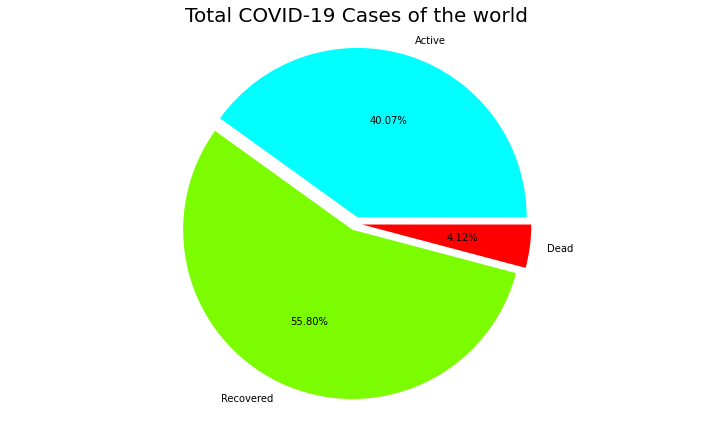

In [37]:
last_day = covid19_world.shape[0]-1
labels = ['Active','Recovered','Dead']
sizes = [covid19_world['Active'][last_day],covid19_world['Recovered'][last_day],covid19_world['Deaths'][last_day]]

plt.figure(figsize= (10,6))
plt.pie(sizes, labels=labels, autopct='%1.2f%%', startangle=0, explode =[0.04,0.04,0.04],
        colors = ['cyan','lawngreen','red'])
#centre_circle = plt.Circle((0,0),0.4,fc='white')

fig = plt.gcf()
#fig.gca().add_artist(centre_circle)
plt.title('Total COVID-19 Cases of the world',fontsize = 20)
plt.axis('equal')  
plt.tight_layout()

In [38]:
# total status of the COVID-19 Cases of the world

date_df2 = covid19_world[['Confirmed', 'Recovered', 'Deaths','Active','Recovery rate(per 100)',
                         'Mortality rate(per 100)','Number of countries']].tail(1)
date_df2.style.background_gradient(cmap='autumn_r',axis=1).format("{:.2f}").format("{:.2f}")

,Confirmed,Recovered,Deaths,Active,Recovery rate(per 100),Mortality rate(per 100),Number of countries
181,14946707.00,8340763.00,616428.00,5989516.00,55.80,4.12,187.00


In [39]:
# get ISO 3 codes for countries to draw choropleth

import pycountry

df1 = pd.read_csv('covid19_date_country.csv')

list_countries = df1['Country/Region'].unique().tolist()
d_country_code = {}  # To hold the country names and their ISO 3 code
for country in list_countries:
    try:
        country_data = pycountry.countries.search_fuzzy(country)
        country_code = country_data[0].alpha_3
        d_country_code.update({country: country_code})
    except:
        print('could not add ISO 3 code for ->', country)

# create a new column iso_alpha in df1
for k, v in d_country_code.items():
    df1.loc[(df1['Country/Region'] == k), 'iso_alpha'] = v

could not add ISO 3 code for -> Burma
could not add ISO 3 code for -> Democratic Republic of the Congo
could not add ISO 3 code for -> Laos
could not add ISO 3 code for -> South Korea
could not add ISO 3 code for -> West Bank and Gaza


In [40]:
configure_plotly_browser_state()

fig = px.choropleth(data_frame = df1, 
                    locations= "iso_alpha",
                    color= "Confirmed",  # value in column 'Confirmed' determines color
                    hover_name= "Country/Region",
                    color_continuous_scale="Viridis_r",
                    animation_frame= "Date",
                    title='Global Spread of Coronavirus-Confirmed')
fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    margin=dict(
        l=1,
        r=1,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()

In [41]:
configure_plotly_browser_state()

fig = px.choropleth(data_frame = df1, 
                    locations= "iso_alpha",
                    color= "Deaths",  # value in column '"Deaths' determines color
                    hover_name= "Country/Region",
                    color_continuous_scale="Viridis_r",
                    animation_frame= "Date",
                    title='Global Spread of Coronavirus-Deaths')
fig.update_layout(
    autosize=False,
    width=900,
    height=600,
    margin=dict(
        l=1,
        r=1,
        b=100,
        t=100,
        pad=4
    ),
)
fig.show()

##  Confirmed, Active, Recovered and Death cases in 10 Most-affected Countries

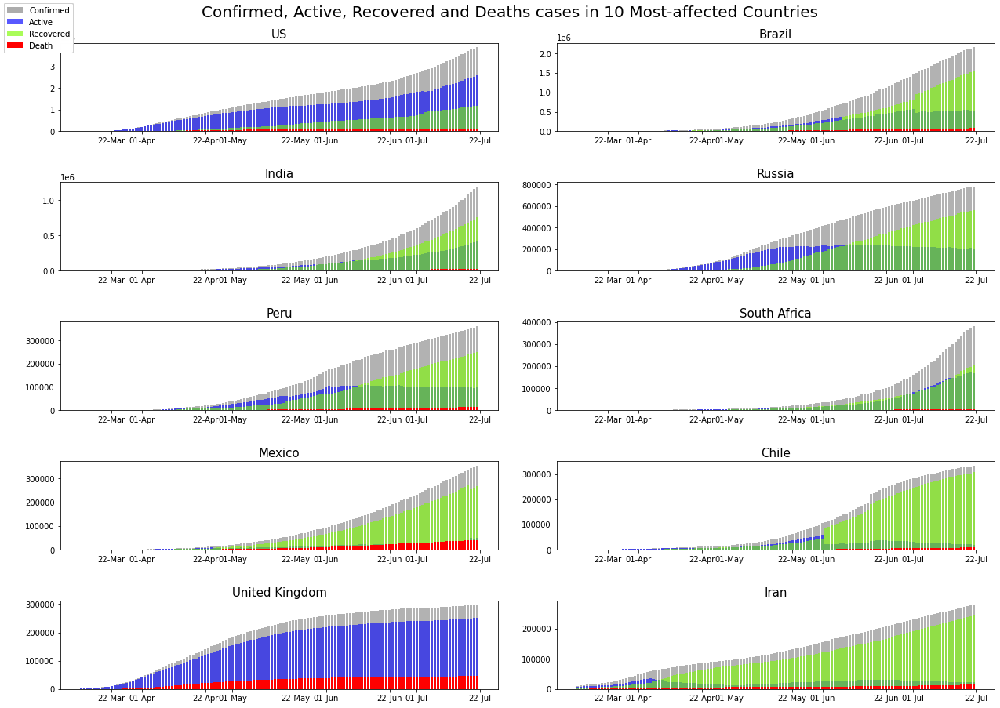

In [42]:
dates = covid19_world['Date'][50:]

# 10 most-affected countries to date 
most_affected=['US','Brazil','India','Russia','Peru','South Africa', 'Mexico','Chile', 'United Kingdom','Iran']

def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected[i]].iloc[50:,:]
    return df

fig = plt.figure(figsize= (18,15))
plt.suptitle('Confirmed, Active, Recovered and Deaths cases in 10 Most-affected Countries', fontsize = 20, y = 1.0)
k=0
for i in range(1,11):
    ax = fig.add_subplot(6,2,i)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%d-%b'))
    ax.bar(dates,country_df(k)['Confirmed'].values,color = 'grey',alpha = 0.6,label = 'Confirmed');
    ax.bar(dates,country_df(k)['Active'].values,color = 'blue',alpha = 0.6,label = 'Active');
    ax.bar(dates,country_df(k)['Recovered'].values,color='lawngreen',alpha = 0.6,label = 'Recovered');
    ax.bar(dates,country_df(k)['Deaths'].values,color='red',label = 'Death');   
    plt.title(most_affected[k], fontsize = 15)
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper left')
    k=k+1

plt.tight_layout(pad=3.0)

### Comparing Covid-19 case status of 10 most affected countries

In [43]:
def compare_plt(col):
    plt.figure(figsize= (20,10))
    plt.xticks(rotation = 60 ,fontsize = 11)
    plt.yticks(fontsize = 10)
    plt.xlabel("Dates",fontsize = 20)
    plt.ylabel('%s cases' % (col),fontsize = 20)
    plt.title("Covid-19 %s Cases of 10 Most Affected Countries" % (col), fontsize = 20)

    for i in range(len(most_affected)):
        plt.plot_date(y= country_df(i)[col].values,x= dates,label = most_affected[i],alpha=0.6,linestyle ='-')
    plt.legend();

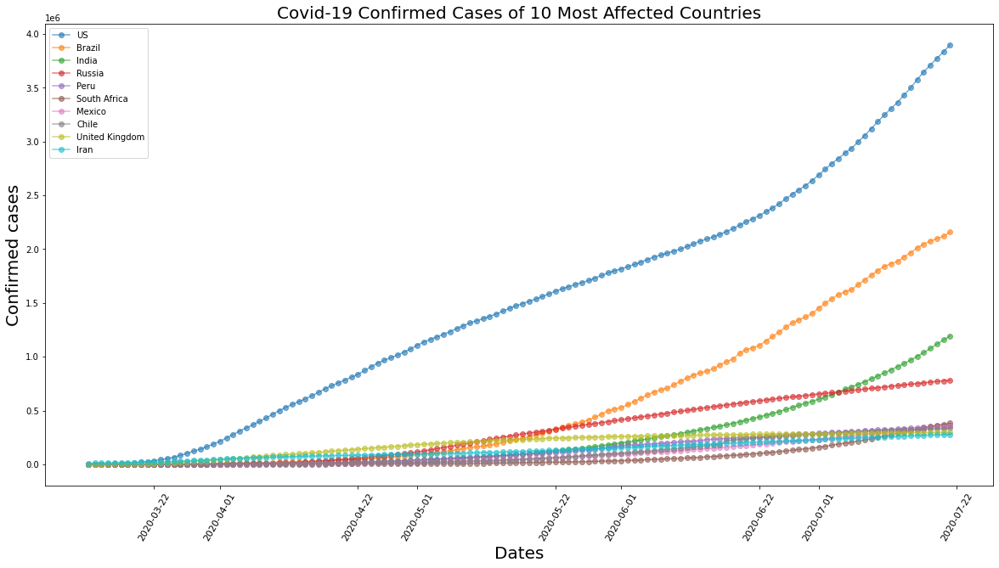

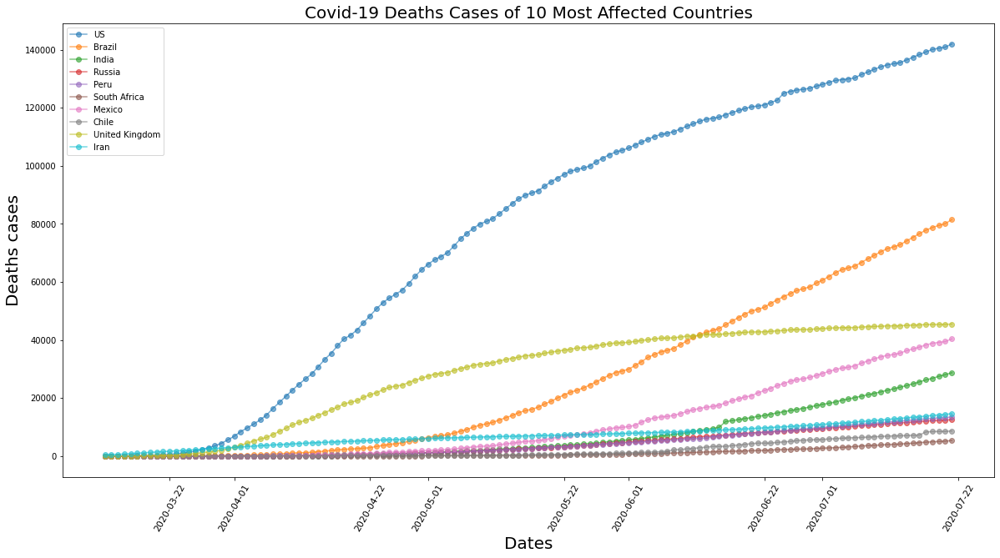

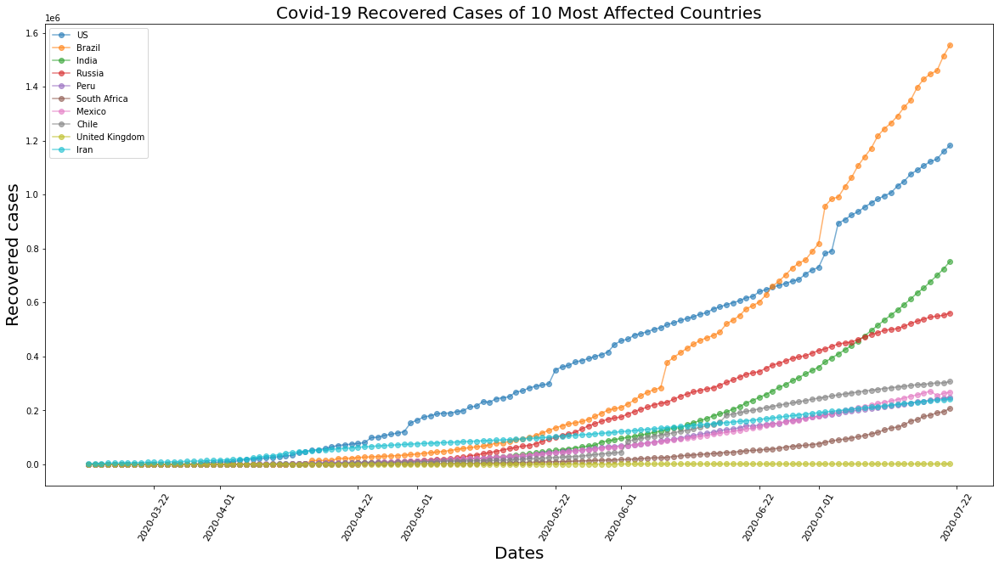

In [44]:
compare_plt('Confirmed')
compare_plt('Deaths')
compare_plt('Recovered')

### Confirmed, Recovered, Active and Death cases in Iran

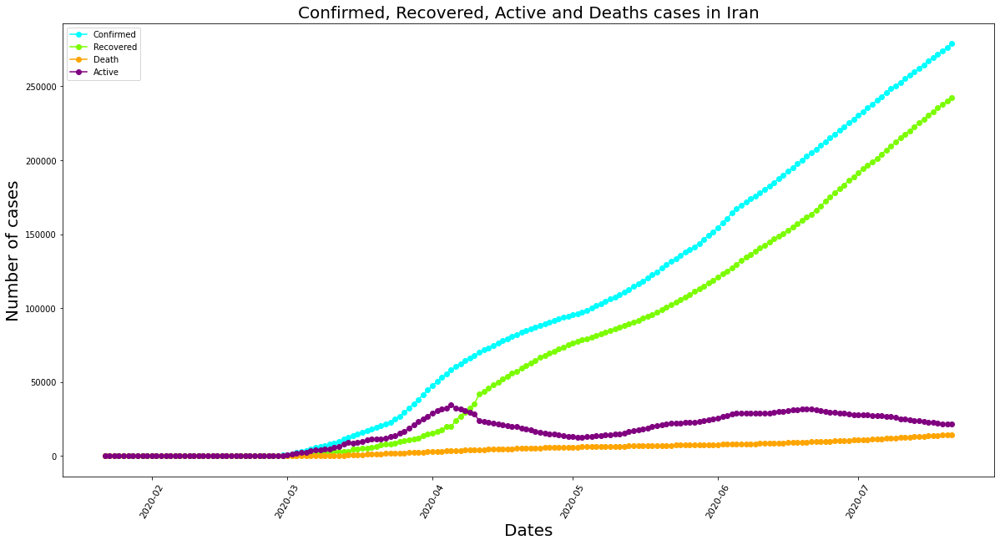

In [45]:
dates = covid19_world['Date'][:]

iran_df=covid19_date_country[covid19_date_country['Country/Region'] == 'Iran'].iloc[:,:] 

plt.figure(figsize= (20,10))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('Number of cases',fontsize = 20)
plt.title("Confirmed, Recovered, Active and Deaths cases in Iran" , fontsize = 20)

ax1 = plt.plot_date(y= iran_df['Confirmed'].values,x= dates,label = 'Confirmed',linestyle ='-',color = 'cyan')
ax2 = plt.plot_date(y= iran_df['Recovered'].values,x= dates,label = 'Recovered',linestyle ='-',color = 'lawngreen')
ax3 = plt.plot_date(y= iran_df['Deaths'].values,x= dates,label = 'Death',linestyle ='-',color = 'orange')
ax4 = plt.plot_date(y= iran_df['Active'].values,x= dates,label = 'Active',linestyle ='-',color = 'purple')
plt.legend()

### Total COVID-19 confirmed, recovered, active and deaths cases (globally)

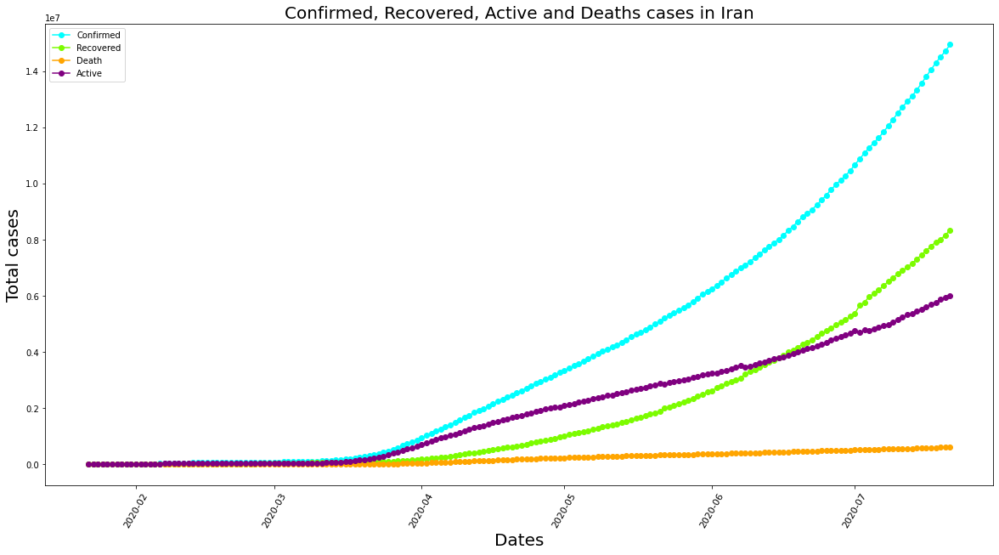

In [46]:
dates = covid19_world['Date'][:]

world_df=covid19_world.iloc[:,:] 

plt.figure(figsize= (20,10))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('Total cases',fontsize = 20)
plt.title("Confirmed, Recovered, Active and Deaths cases in Iran" , fontsize = 20)

ax1 = plt.plot_date(y= world_df['Confirmed'].values,x= dates,label = 'Confirmed',linestyle ='-',color = 'cyan')
ax2 = plt.plot_date(y= world_df['Recovered'].values,x= dates,label = 'Recovered',linestyle ='-',color = 'lawngreen')
ax3 = plt.plot_date(y= world_df['Deaths'].values,x= dates,label = 'Death',linestyle ='-',color = 'orange')
ax4 = plt.plot_date(y= world_df['Active'].values,x= dates,label = 'Active',linestyle ='-',color = 'purple')
plt.legend()

In [47]:
covid19_country_latest.copy().drop(['WHO region'],axis=1).sort_values('Confirmed',ascending=False)\
                    .reset_index(drop=True).iloc[:30,:].style.bar(align='left',width=80,color='gold')

,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100)
0,US,3899211,141995,1182018,2575198,64534,1082,21931,30.310000,3.640000
1,Brazil,2159654,81487,1555339,522828,41008,1367,41039,72.020000,3.770000
2,India,1193078,28732,753050,411296,37740,650,28472,63.120000,2.410000
3,Russia,782040,12561,561397,208082,5828,153,8753,71.790000,1.610000
4,South Africa,381798,5368,208144,168286,8170,195,13279,54.520000,1.410000
5,Peru,362087,13579,248746,99762,8497,392,3665,68.700000,3.750000
6,Mexico,356255,40400,267407,48448,6859,915,4316,75.060000,11.340000
7,Chile,334683,8677,306816,19190,3753,174,5022,91.670000,2.590000
8,United Kingdom,297389,45507,1414,250468,445,110,1,0.480000,15.300000
9,Iran,278827,14634,242351,21842,2625,229,2264,86.920000,5.250000


## Data modelling and prediction based on univariate time series

### Prediction of total confirmed cases of the world

In [48]:
# find numbers related to dates
numbers_of_dates = covid19_world.index.values.reshape(-1, 1)

# number of days in future considered to forecast
future_days = 10

# find numbers related to days from start to future
numbers_start_to_futures = np.array([i for i in range(covid19_world.shape[0]+future_days)]).reshape(-1, 1)

# first date in the dataset
first_date = covid19_world['Date'].tolist()[0]

# find dates related to days from start to future for better visualization
dates_start_to_futures = pd.Series([(first_date + timedelta(days=i)) for i in range(len(numbers_start_to_futures))])
print(dates_start_to_futures.shape)

(192,)


In [49]:
#Splitting the dataset related to confirmed cases of the world into training and test sets

X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(numbers_of_dates[50:],
                                                                                covid19_world['Confirmed'][50:].values,
                                                                                test_size = 0.2, shuffle=False)

print(X_train_confirmed.shape)
print(y_train_confirmed.shape)
print(X_test_confirmed.shape)
print(y_test_confirmed.shape)

(105, 1)
(105,)
(27, 1)
(27,)


#### Support vector machine regressor

RMSE of  SVR 84966.99
MSE of  SVR 7219388911.3
MAE of  SVR 76997.66 



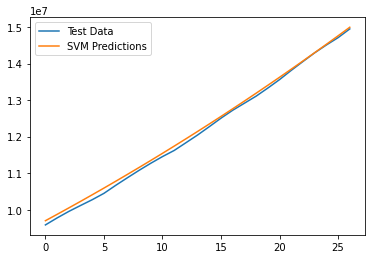

In [50]:
svm_reg = SVR(C=0.1,kernel='poly',gamma=0.01, epsilon=1)
svm_reg.fit(X_train_confirmed, y_train_confirmed)

svm_pred = svm_reg.predict(numbers_start_to_futures[50:])

y_pred = svm_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MSE of ", svm_reg.__class__.__name__, round(mse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

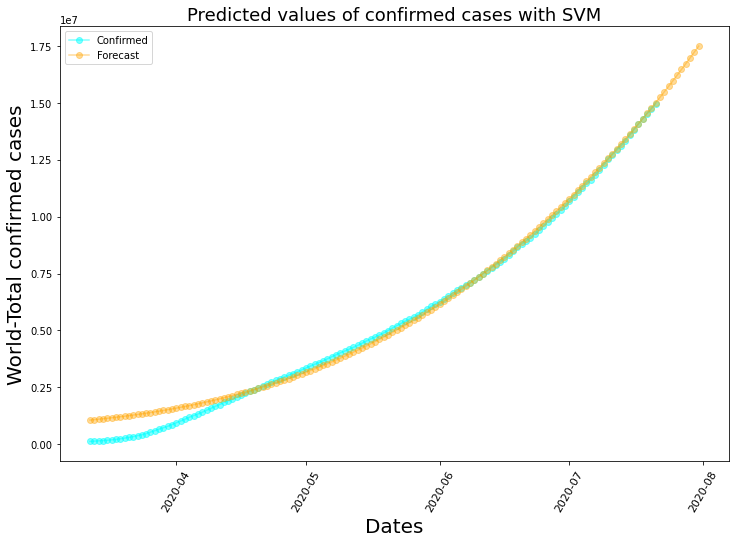

In [51]:
dates = dates_start_to_futures[50:-10]

world_df=covid19_world.iloc[50:,:] 

plt.figure(figsize= (12,8))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total confirmed cases',fontsize = 20)
plt.title("Predicted values of confirmed cases with SVM" , fontsize = 18)

plt.plot_date(y= world_df['Confirmed'].values, x= dates, label = 'Confirmed',alpha=0.5,linestyle ='-',color = 'cyan')
plt.plot_date(y= svm_pred,x= dates_start_to_futures[50:],label = 'Forecast',alpha=0.4,linestyle ='-',color = 'orange')
plt.legend()

#### Polynomial regression

coef:  [ 7.66232598e+06 -4.13340380e+05  7.37233563e+03 -4.92037057e+01
  1.25056541e-01]
RMSE of  LinearRegression 880894.85
MSE of  LinearRegression 775975734097.33
MAE of  LinearRegression 701164.06 



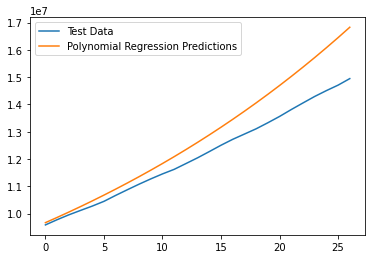

In [52]:
# transform the training data

poly_features=PolynomialFeatures(degree=4)

poly_X_train_confirmed = poly_features.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly_features.fit_transform(X_test_confirmed)
poly_future_forecast = poly_features.fit_transform(numbers_start_to_futures[50:])

# fit a Linear Regression model
lin_reg=LinearRegression(normalize=True, fit_intercept=False)

lin_reg.fit(poly_X_train_confirmed,y_train_confirmed)
coef=lin_reg.coef_
print("coef: ", coef)

y_pred = lin_reg.predict(poly_X_test_confirmed)

poly_pred = lin_reg.predict(poly_future_forecast)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", lin_reg.__class__.__name__, round(rmse,2))
print("MSE of ", lin_reg.__class__.__name__, round(mse,2))
print("MAE of ", lin_reg.__class__.__name__, round(mae,2), '\n')

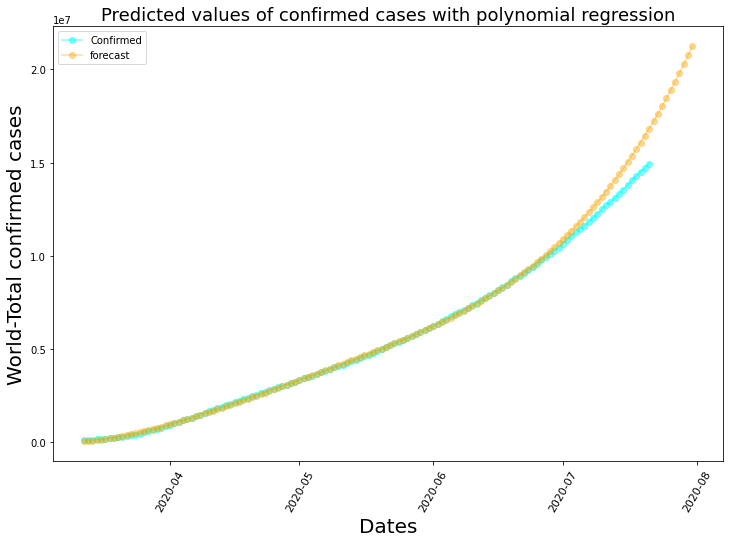

In [53]:
dates = dates_start_to_futures[50:-10]

world_df=covid19_world.iloc[50:,:] 

plt.figure(figsize= (12,8))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total confirmed cases',fontsize = 20)
plt.title("Predicted values of confirmed cases with polynomial regression" , fontsize = 18)

plt.plot_date(y= world_df['Confirmed'].values, x= dates, label = 'Confirmed',alpha=0.5,linestyle ='-',color = 'cyan')
plt.plot_date(y= poly_pred,x= dates_start_to_futures[50:],label = 'forecast',alpha=0.4,linestyle ='-',color = 'orange')
plt.legend()

#### Random Forests Regressor

RMSE of  RandomForestRegressor 3276754.78
MSE of  RandomForestRegressor 10737121857410.46
MAE of  RandomForestRegressor 2851208.24 



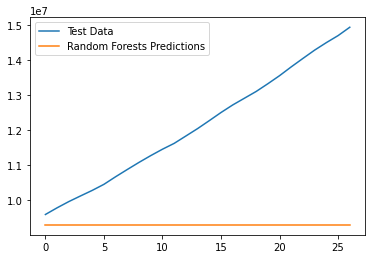

In [54]:
rf_reg = RandomForestRegressor(max_depth=7,n_estimators=50, random_state=42)

rf_reg.fit(X_train_confirmed, y_train_confirmed)

rf_pred = rf_reg.predict(numbers_start_to_futures[50:])

y_pred = rf_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'Random Forests Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", rf_reg.__class__.__name__, round(rmse,2))
print("MSE of ", rf_reg.__class__.__name__, round(mse,2))
print("MAE of ", rf_reg.__class__.__name__, round(mae,2), '\n')

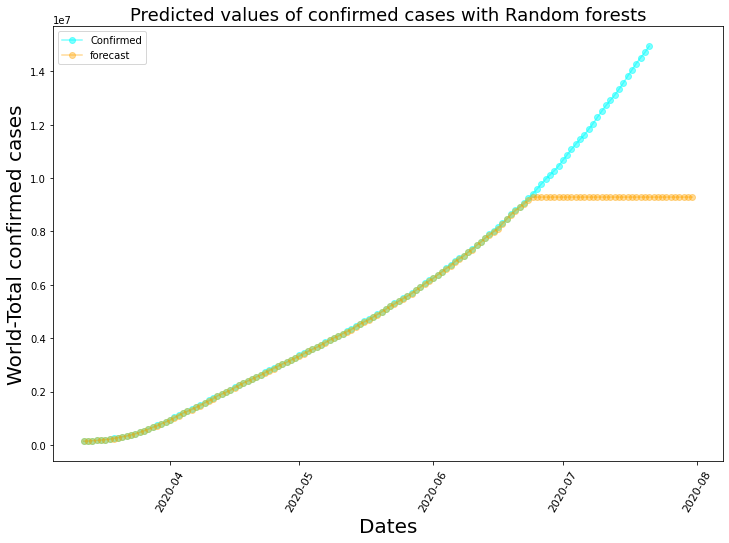

In [55]:
dates = dates_start_to_futures[50:-10]

world_df=covid19_world.iloc[50:,:] 

plt.figure(figsize= (12,8))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total confirmed cases',fontsize = 20)
plt.title("Predicted values of confirmed cases with Random forests" , fontsize = 18)

plt.plot_date(y= world_df['Confirmed'].values, x= dates, label = 'Confirmed',alpha=0.5,linestyle ='-',color = 'cyan')
plt.plot_date(y= rf_pred,x= dates_start_to_futures[50:],label = 'forecast',alpha=0.4,linestyle ='-',color = 'orange')
plt.legend()

#### XGBoost Regressor

In [56]:
xgb_reg=XGBRegressor(n_estimators=1000, learning_rate=0.05, n_jobs=4)
xgb_reg.fit(X_train_confirmed, y_train_confirmed, early_stopping_rounds=10,
            eval_set=[(X_test_confirmed, y_test_confirmed)],verbose=0)

[16:18:35] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=4, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

RMSE of  XGBRegressor 3172170.09
MSE of  XGBRegressor 10062663048832.37
MAE of  XGBRegressor 2730371.7 



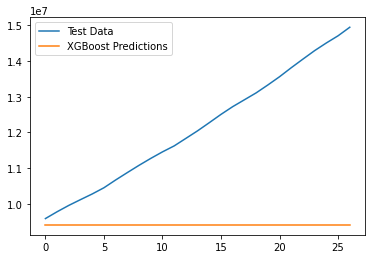

In [57]:
xgb_reg=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1,
             n_estimators=1000, n_jobs=4, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=0)

xgb_reg.fit(X_train_confirmed, y_train_confirmed)

xgb_pred = xgb_reg.predict(numbers_start_to_futures[50:])

y_pred = xgb_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'XGBoost Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", xgb_reg.__class__.__name__, round(rmse,2))
print("MSE of ", xgb_reg.__class__.__name__, round(mse,2))
print("MAE of ", xgb_reg.__class__.__name__, round(mae,2), '\n')

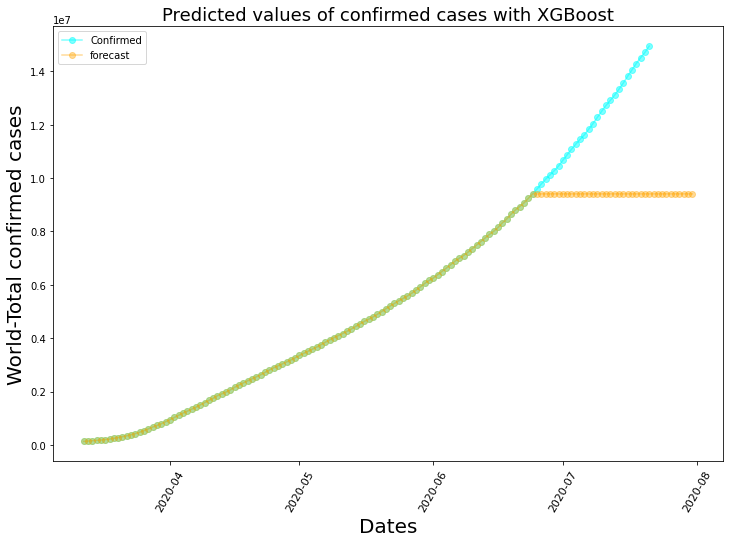

In [58]:
dates = dates_start_to_futures[50:-10]

world_df=covid19_world.iloc[50:,:] 

plt.figure(figsize= (12,8))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total confirmed cases',fontsize = 20)
plt.title("Predicted values of confirmed cases with XGBoost" , fontsize = 18)

plt.plot_date(y= world_df['Confirmed'].values, x= dates, label = 'Confirmed',alpha=0.5,linestyle ='-',color = 'cyan')
plt.plot_date(y= xgb_pred,x= dates_start_to_futures[50:],label = 'forecast',alpha=0.4,linestyle ='-',color = 'orange')
plt.legend()

#### ARIMA for prediction

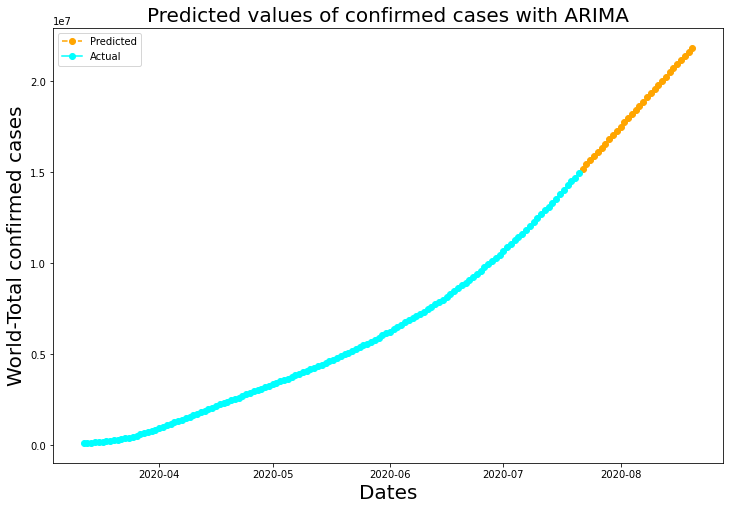

In [59]:
data = pd.DataFrame(columns = ['Date','y'])
data['Date'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Confirmed'][50:].values

arima = ARIMA(data['y'], order=(5, 1, 0))
arima = arima.fit(trend='c', full_output=True, disp=True)
forecast = arima.forecast(steps= 30)
pred = list(forecast[0])

start_date = data['Date'].max()
prediction_dates = []
for i in range(30):
    date = start_date + timedelta(days=1)
    prediction_dates.append(date)
    start_date = date
plt.figure(figsize= (12,8))
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total confirmed cases',fontsize = 20)
plt.title("Predicted values of confirmed cases with ARIMA" , fontsize = 20)

plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'orange',label = 'Predicted');
plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'cyan',label = 'Actual');
plt.legend();

#### Prophet Model for prediction
Note: I could not run these part of cells in my PC, because I had some problems with installation of `fbprophet` on Windows 10. So, I run it in kaggle notebook and then put its image as the output of this cell.

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


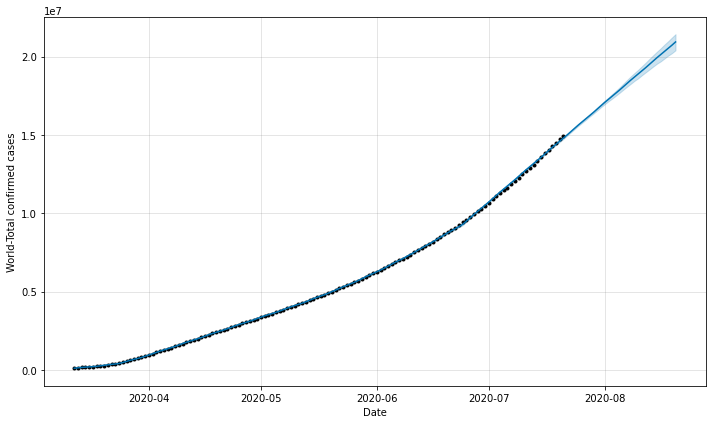

In [60]:
data = pd.DataFrame(columns = ['ds','y'])
data['ds'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Confirmed'][50:].values

prop=Prophet()
prop.fit(data)
future=prop.make_future_dataframe(periods=30)
prop_forecast=prop.predict(future)
forecast = prop_forecast[['ds','yhat']].tail(30)

fig = plot_plotly(prop, prop_forecast)
fig = prop.plot(prop_forecast,xlabel='Date',ylabel='World-Total confirmed cases')

### Prediction of total death cases of the world

In [61]:
#Splitting the dataset related to death cases of the world into training and test sets

X_train_death, X_test_death, y_train_death, y_test_death = train_test_split(numbers_of_dates[50:],
                                                                                covid19_world['Deaths'][50:].values,
                                                                                test_size = 0.2, shuffle=False)

print(X_train_death.shape)
print(y_train_death.shape)
print(X_test_death.shape)
print(y_test_death.shape)

(105, 1)
(105,)
(27, 1)
(27,)


#### Support vector machine regressor

RMSE of  SVR 140140.8
MSE of  SVR 19639444298.78
MAE of  SVR 132062.98 



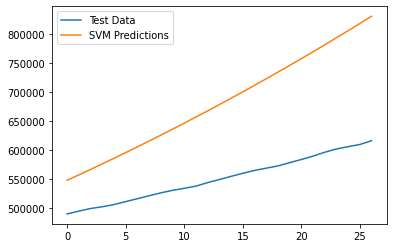

In [62]:
svm_reg = SVR(C=0.01,kernel='poly',gamma=0.01)
svm_reg.fit(X_train_death, y_train_death)

svm_pred = svm_reg.predict(numbers_start_to_futures[50:])

y_pred = svm_reg.predict(X_test_death)

plt.plot(y_test_death)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_death)
mse=mean_squared_error(y_pred, y_test_death)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MSE of ", svm_reg.__class__.__name__, round(mse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

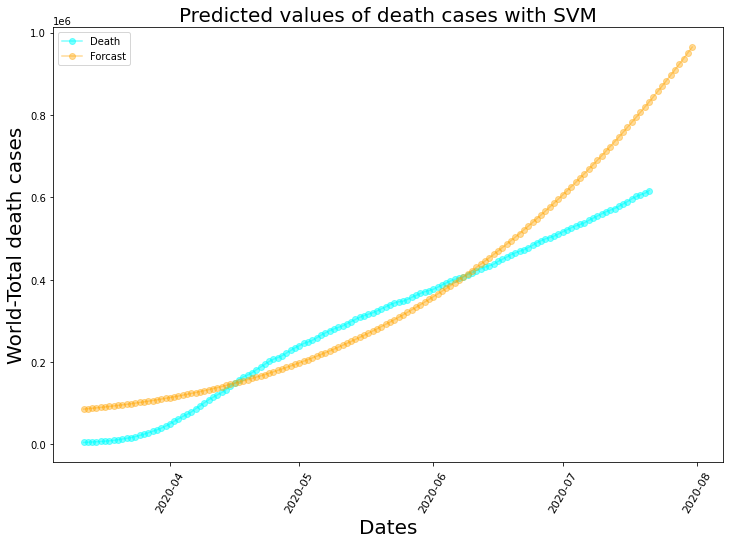

In [63]:
dates = dates_start_to_futures[50:-10]

world_df=covid19_world.iloc[50:,:] 

plt.figure(figsize= (12,8))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total death cases',fontsize = 20)
plt.title("Predicted values of death cases with SVM" , fontsize = 20)

plt.plot_date(y= world_df['Deaths'].values, x= dates, label = 'Death',alpha=0.5,linestyle ='-',color = 'cyan')
plt.plot_date(y= svm_pred,x= dates_start_to_futures[50:],label = 'Forcast',alpha=0.4,linestyle ='-',color = 'orange')
plt.legend()

#### Polynomial regression

coef:  [ 2.33487709e+06 -1.21007616e+05  2.29232371e+03 -1.97679081e+01
  8.13529452e-02 -1.28597429e-04]
RMSE of  LinearRegression 19356.94
MSE of  LinearRegression 374691214.36
MAE of  LinearRegression 16993.0 



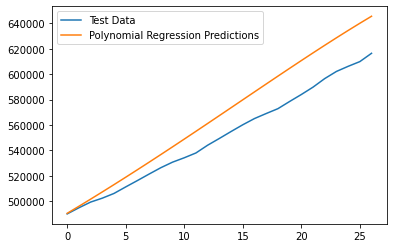

In [64]:
# transform the training data

poly_features=PolynomialFeatures(degree=5)

poly_X_train_death = poly_features.fit_transform(X_train_death)
poly_X_test_death = poly_features.fit_transform(X_test_death)
poly_future_forecast = poly_features.fit_transform(numbers_start_to_futures[50:])

# fit a Linear Regression model
lin_reg=LinearRegression(normalize=True, fit_intercept=False)

lin_reg.fit(poly_X_train_death,y_train_death)
coef=lin_reg.coef_
print("coef: ", coef)

y_pred = lin_reg.predict(poly_X_test_death)

poly_pred = lin_reg.predict(poly_future_forecast)

plt.plot(y_test_death)
plt.plot(y_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

mae=mean_absolute_error(y_pred, y_test_death)
mse=mean_squared_error(y_pred, y_test_death)
rmse = np.sqrt(mse)
print("RMSE of ", lin_reg.__class__.__name__, round(rmse,2))
print("MSE of ", lin_reg.__class__.__name__, round(mse,2))
print("MAE of ", lin_reg.__class__.__name__, round(mae,2), '\n')

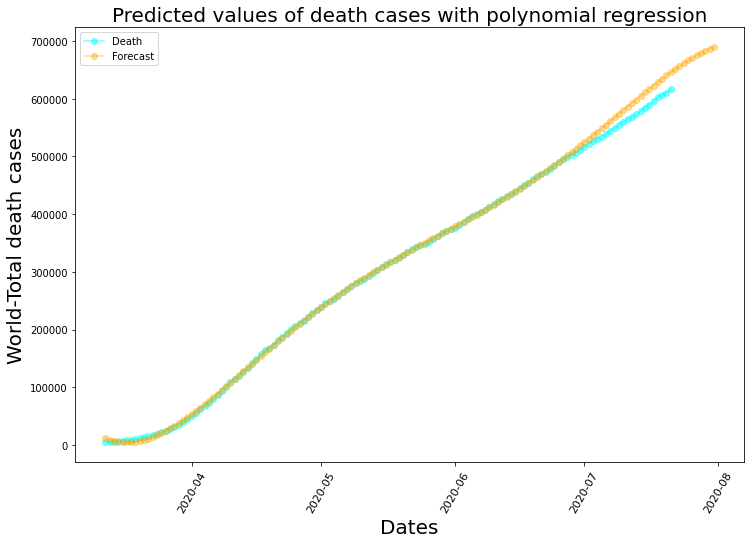

In [65]:
dates = dates_start_to_futures[50:-10]

world_df=covid19_world.iloc[50:,:] 

plt.figure(figsize= (12,8))
plt.xticks(rotation = 60 ,fontsize = 11)
plt.yticks(fontsize = 10)
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total death cases',fontsize = 20)
plt.title("Predicted values of death cases with polynomial regression" , fontsize = 20)

plt.plot_date(y= world_df['Deaths'].values, x= dates, label = 'Death',alpha=0.5,linestyle ='-',color = 'cyan')
plt.plot_date(y= poly_pred,x= dates_start_to_futures[50:],label = 'Forecast',alpha=0.4,linestyle ='-',color = 'orange')
plt.legend()

#### ARIMA for prediction

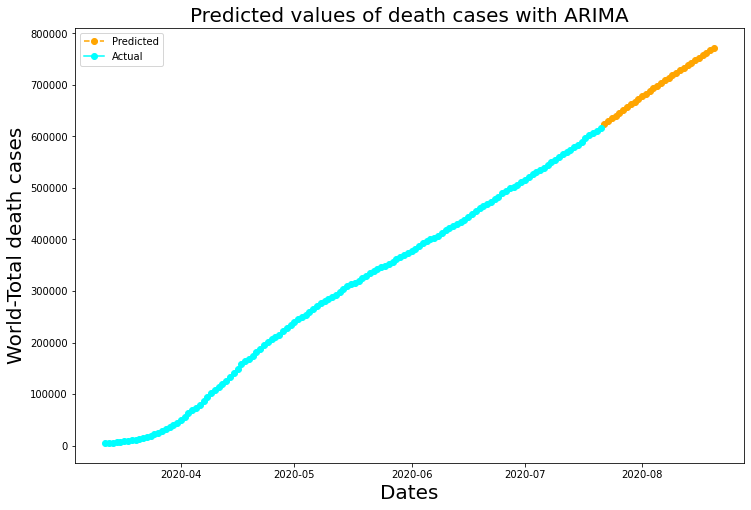

In [66]:
data = pd.DataFrame(columns = ['Date','y'])
data['Date'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Deaths'][50:].values

arima = ARIMA(data['y'], order=(5, 1, 0))
arima = arima.fit(trend='c', full_output=True, disp=True)
forecast = arima.forecast(steps= 30)
pred = list(forecast[0])

start_date = data['Date'].max()
prediction_dates = []
for i in range(30):
    date = start_date + timedelta(days=1)
    prediction_dates.append(date)
    start_date = date
plt.figure(figsize= (12,8))
plt.xlabel("Dates",fontsize = 20)
plt.ylabel('World-Total death cases',fontsize = 20)
plt.title("Predicted values of death cases with ARIMA" , fontsize = 20)

plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'orange',label = 'Predicted');
plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'cyan',label = 'Actual');
plt.legend();

#### Prophet Model for prediction

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


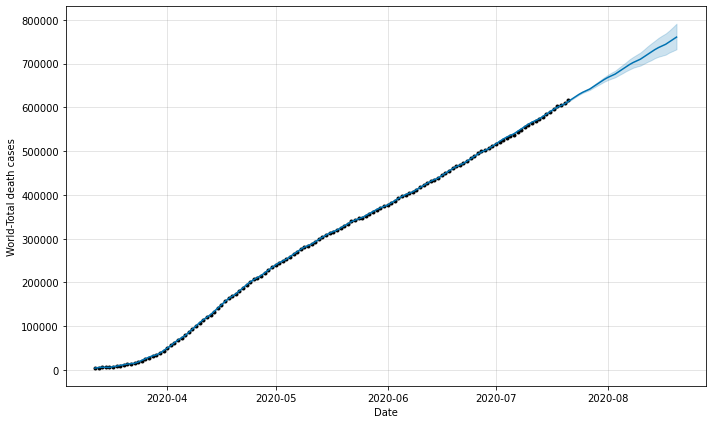

In [67]:
data = pd.DataFrame(columns = ['ds','y'])
data['ds'] = covid19_world['Date'][50:]
data['y'] = covid19_world['Deaths'][50:].values

prop=Prophet()
prop.fit(data)
future=prop.make_future_dataframe(periods=30)
prop_forecast=prop.predict(future)
forecast = prop_forecast[['ds','yhat']].tail(30)

fig = plot_plotly(prop, prop_forecast)
fig = prop.plot(prop_forecast,xlabel='Date',ylabel='World-Total death cases')

### Prediction of confirmed cases of 5 most affected countries and Iran using ARIMA and Prophet

#### ARIMA for prediction

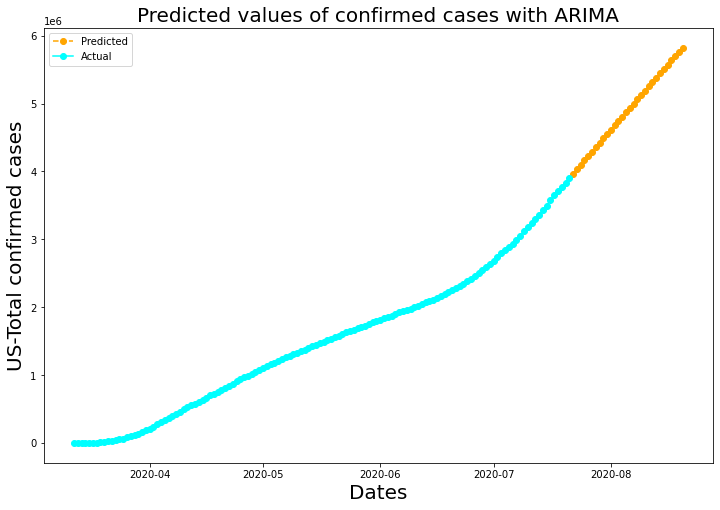

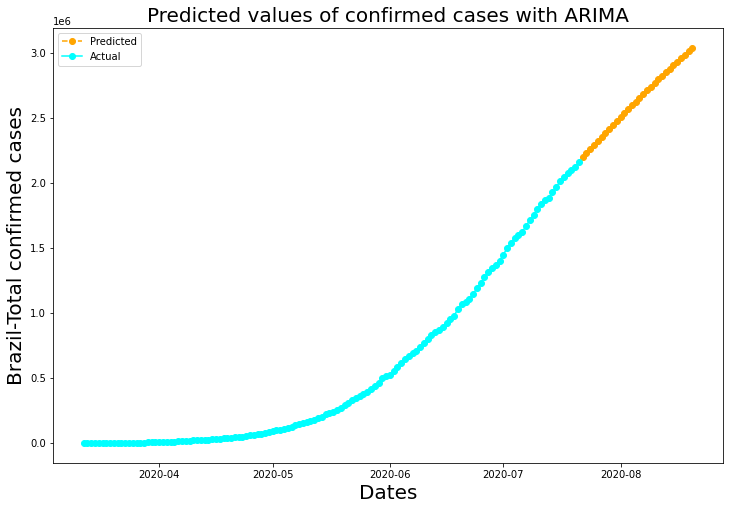

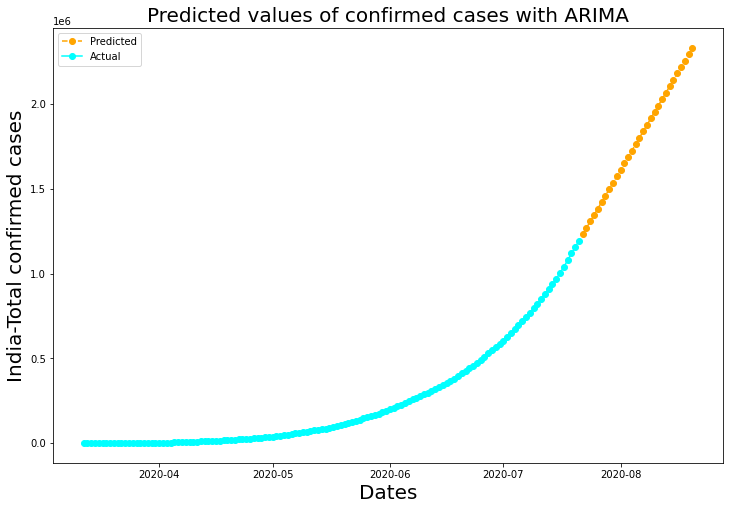

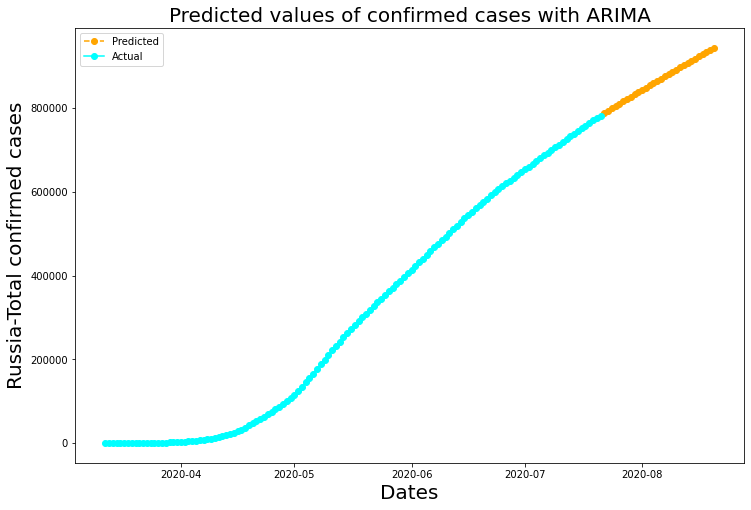

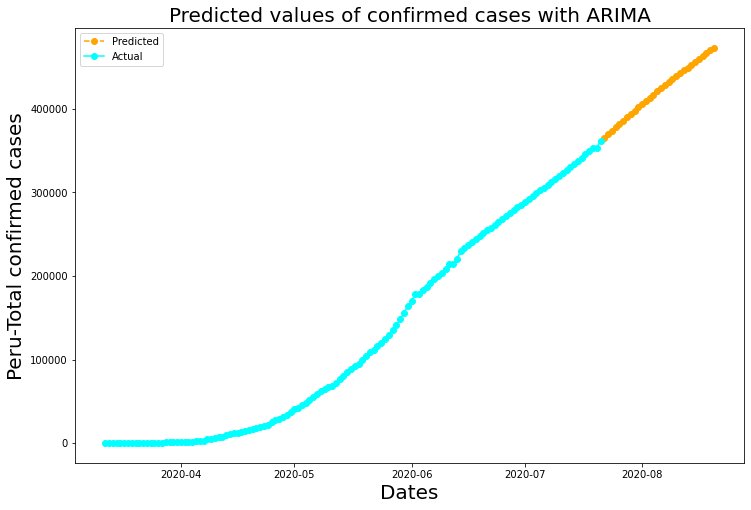

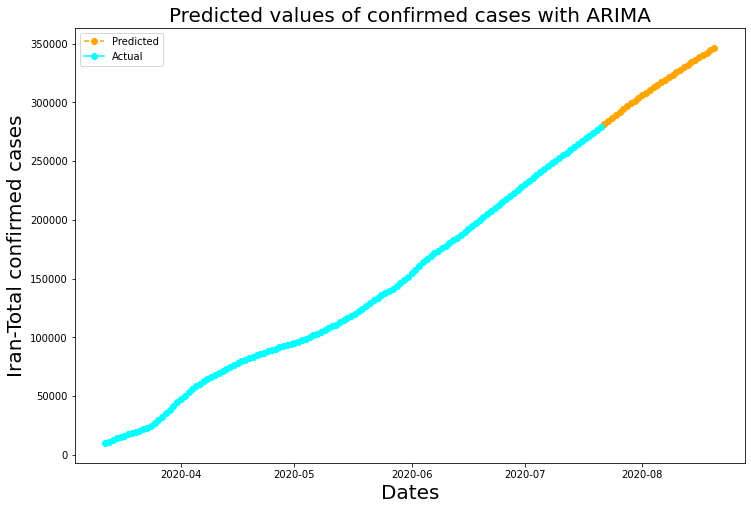

In [68]:
most_affected5=['US','Brazil','India','Russia','Peru','Iran']

def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['Date','y'])
    data['Date'] = covid19_world['Date'][50:]
    data['y'] = country_df(k)['Confirmed'].values

    arima = ARIMA(data['y'], order=(5, 1, 0))
    arima = arima.fit(trend='c', full_output=True, disp=True)
    forecast = arima.forecast(steps= 30)
    pred = list(forecast[0])

    start_date = data['Date'].max()
    prediction_dates = []
    for i in range(30):
        date = start_date + timedelta(days=1)
        prediction_dates.append(date)
        start_date = date
    plt.figure(figsize= (12,8))
    plt.xlabel("Dates",fontsize = 20)
    plt.ylabel('%s-Total confirmed cases' %(j),fontsize = 20)
    plt.title("Predicted values of confirmed cases with ARIMA" , fontsize = 20)

    plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'orange',label = 'Predicted');
    plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'cyan',label = 'Actual');
    plt.legend();
    k=k+1

#### Prophet Model for prediction

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

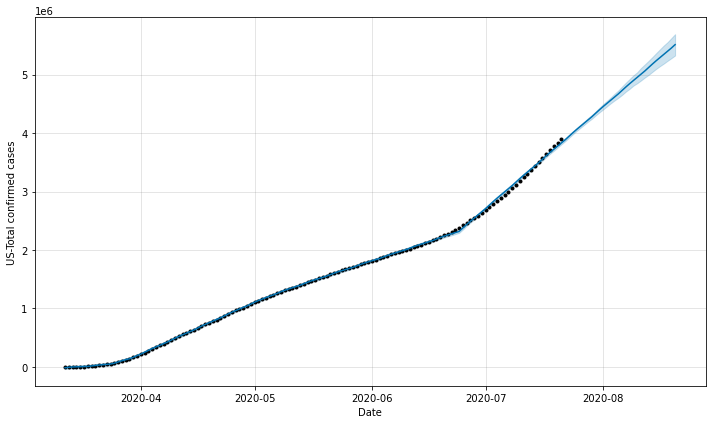

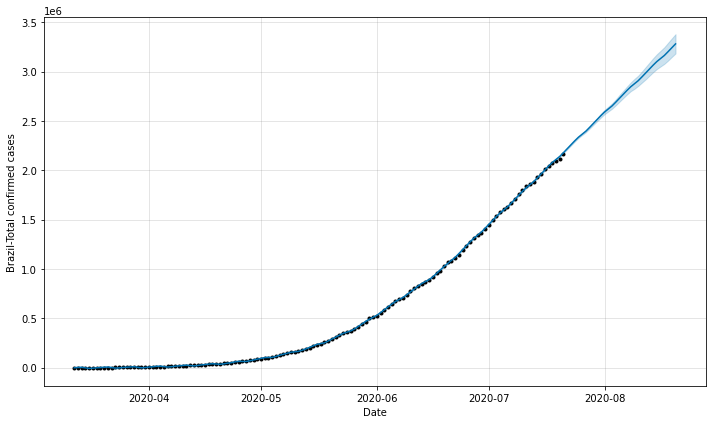

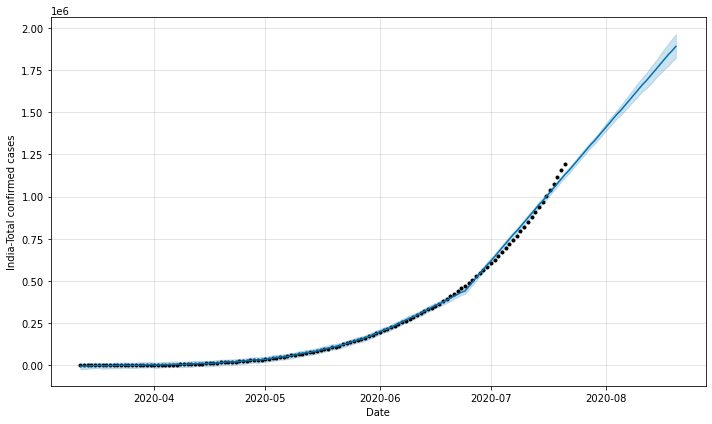

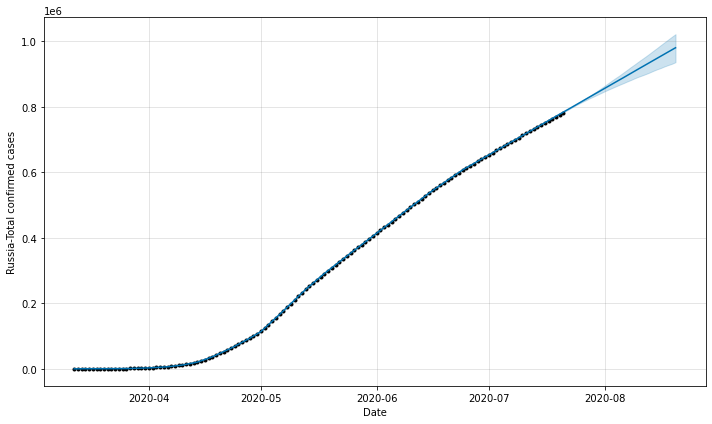

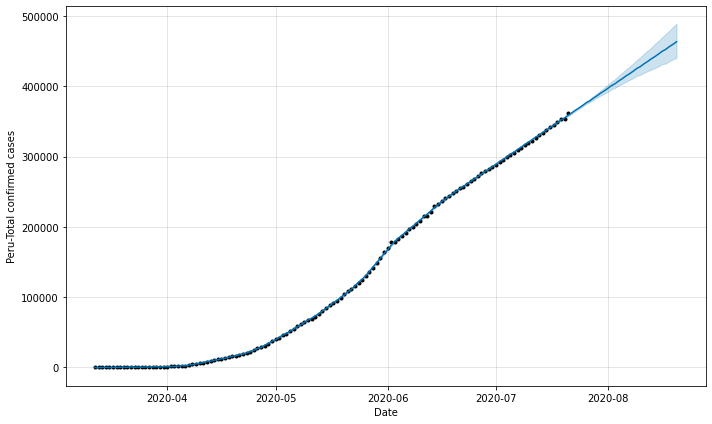

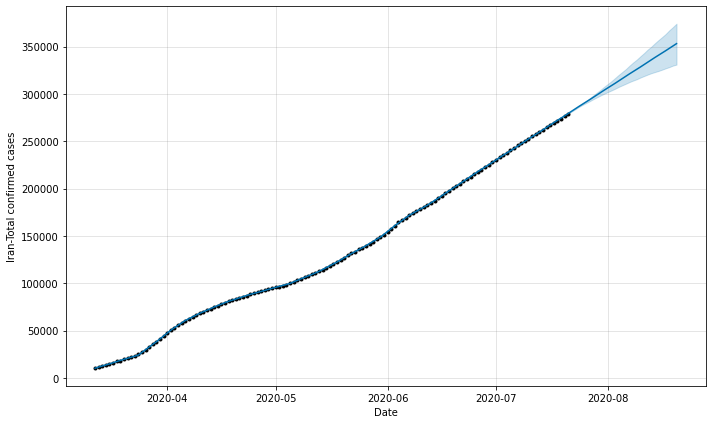

In [69]:
#most_affected5=['US','Brazil','India','Russia','Peru','Iran']

def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['ds','y'])
    data['ds'] = covid19_world['Date'][50:]
    data['y'] = country_df(k)['Confirmed'].values

    prop=Prophet()
    prop.fit(data)
    future=prop.make_future_dataframe(periods=30)
    prop_forecast=prop.predict(future)
    forecast = prop_forecast[['ds','yhat']].tail(30)

    fig = plot_plotly(prop, prop_forecast)
    fig = prop.plot(prop_forecast,xlabel='Date',ylabel='%s-Total confirmed cases' %(j))
    k=k+1

### Prediction of deaths of 5 most affected countries and Iran using ARIMA and Prophet

#### ARIMA for prediction

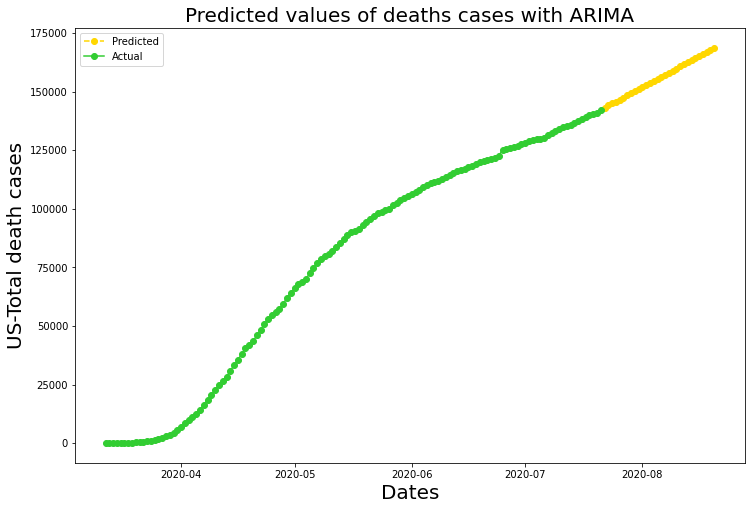

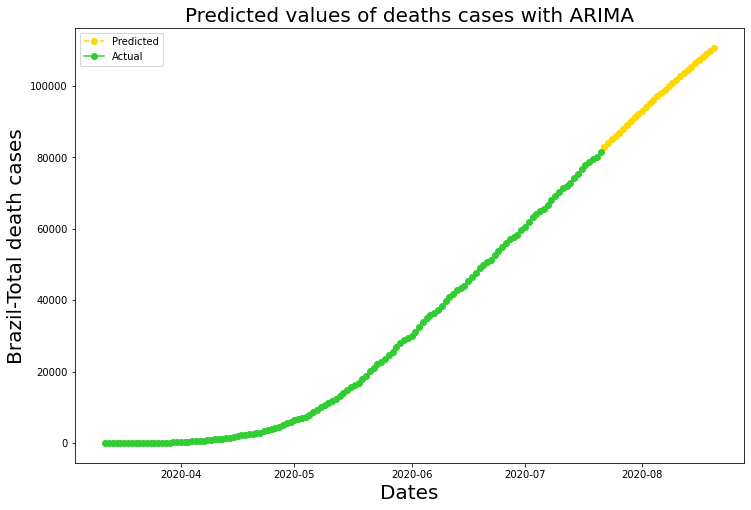

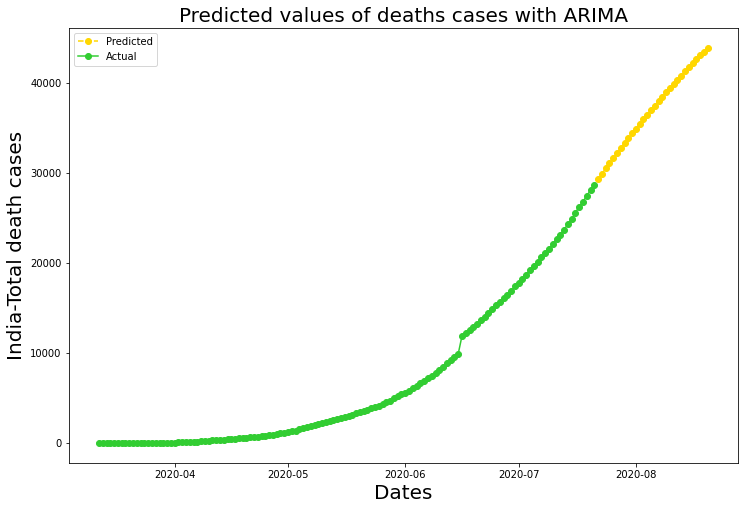

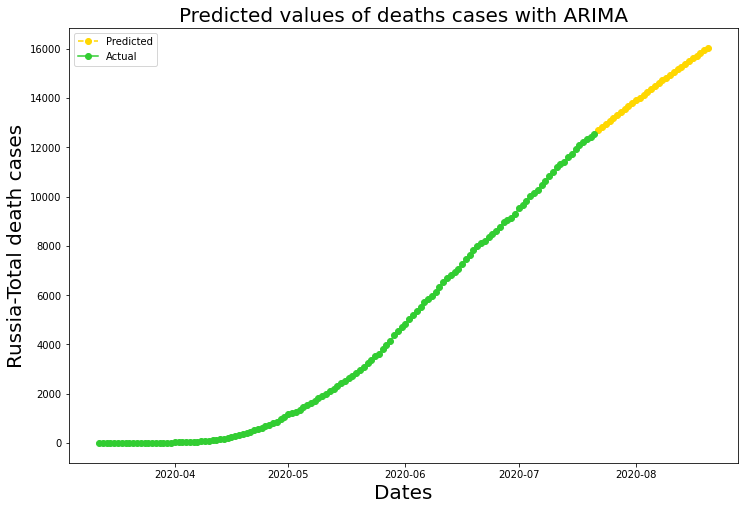

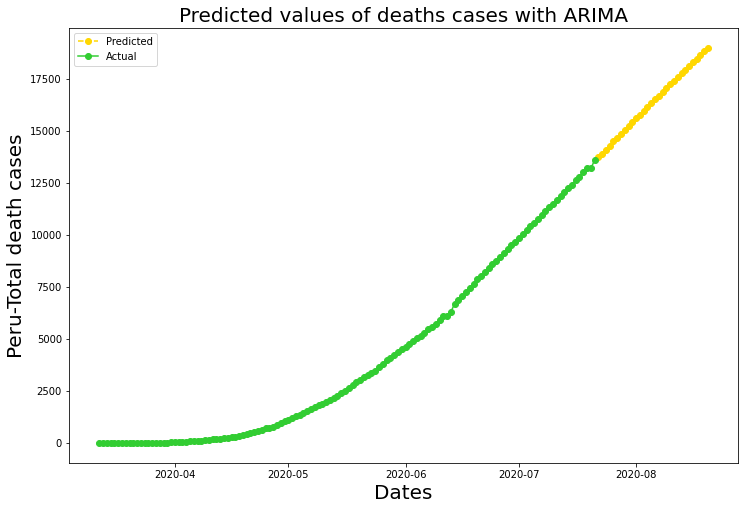

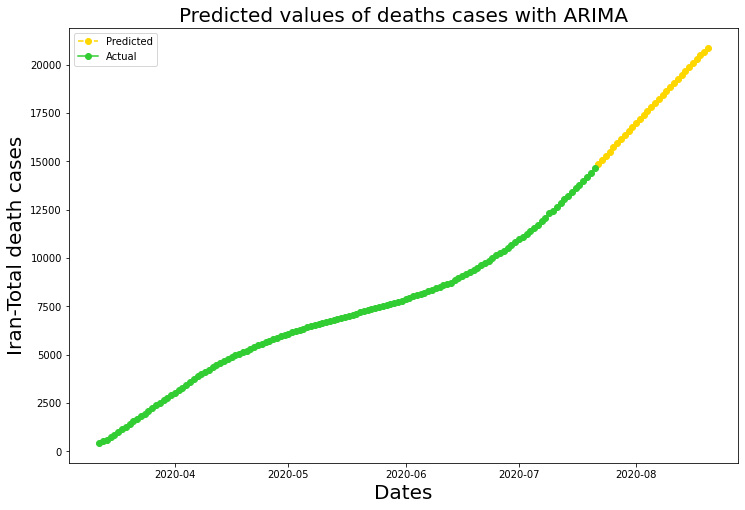

In [70]:
most_affected5=['US','Brazil','India','Russia','Peru','Iran']

def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['Date','y'])
    data['Date'] = covid19_world['Date'][50:]
    data['y'] = country_df(k)['Deaths'].values

    arima = ARIMA(data['y'], order=(5, 1, 0))
    arima = arima.fit(trend='c', full_output=True, disp=True)
    forecast = arima.forecast(steps= 30)
    pred = list(forecast[0])

    start_date = data['Date'].max()
    prediction_dates = []
    for i in range(30):
        date = start_date + timedelta(days=1)
        prediction_dates.append(date)
        start_date = date
    plt.figure(figsize= (12,8))
    plt.xlabel("Dates",fontsize = 20)
    plt.ylabel('%s-Total death cases' %(j),fontsize = 20)
    plt.title("Predicted values of deaths cases with ARIMA" , fontsize = 20)

    plt.plot_date(y= pred,x= prediction_dates,linestyle ='dashed',color = 'gold',label = 'Predicted');
    plt.plot_date(y=data['y'],x=data['Date'],linestyle = '-',color = 'limegreen',label = 'Actual');
    plt.legend();
    k=k+1

#### Prophet Model for prediction

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seaso

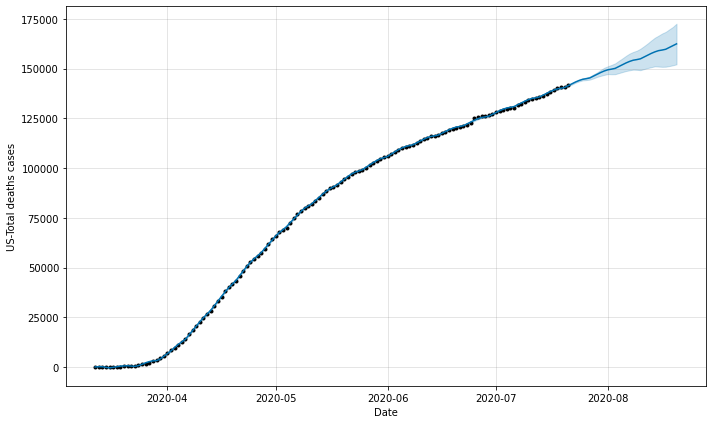

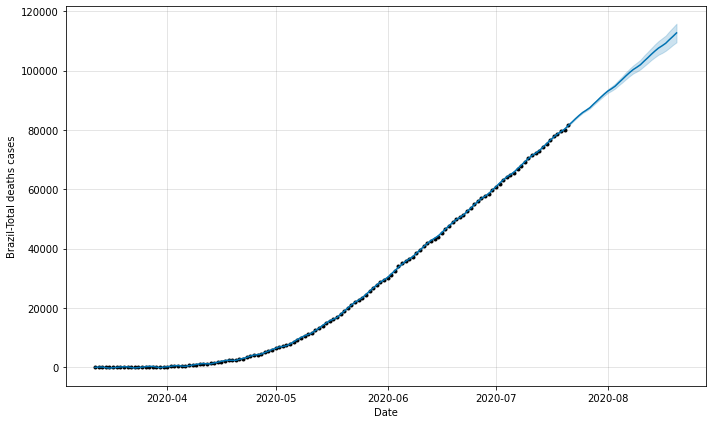

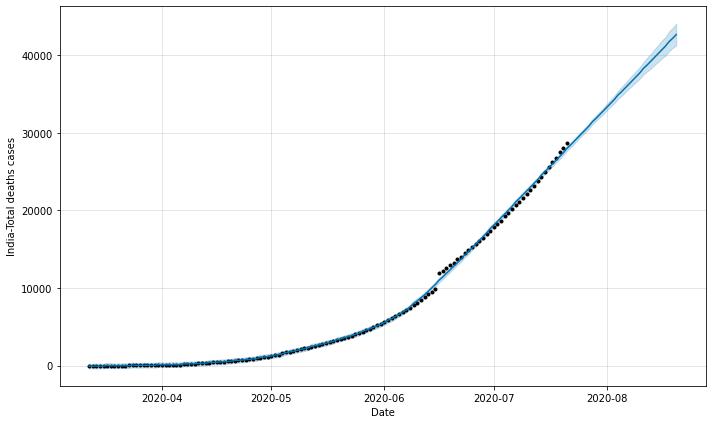

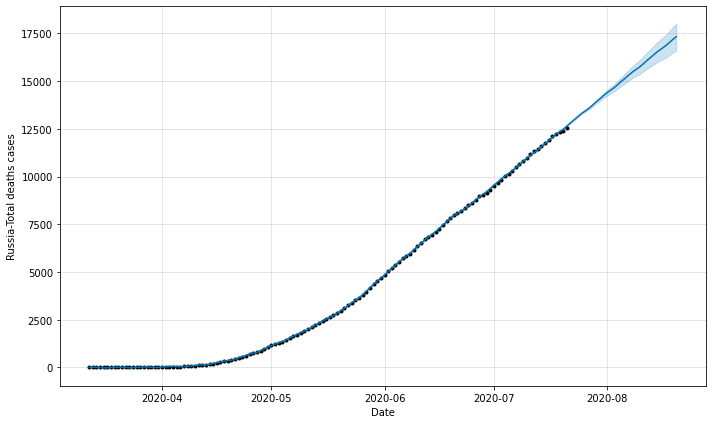

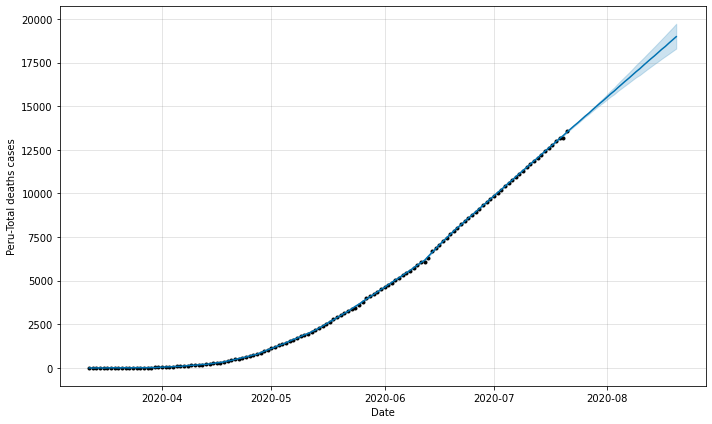

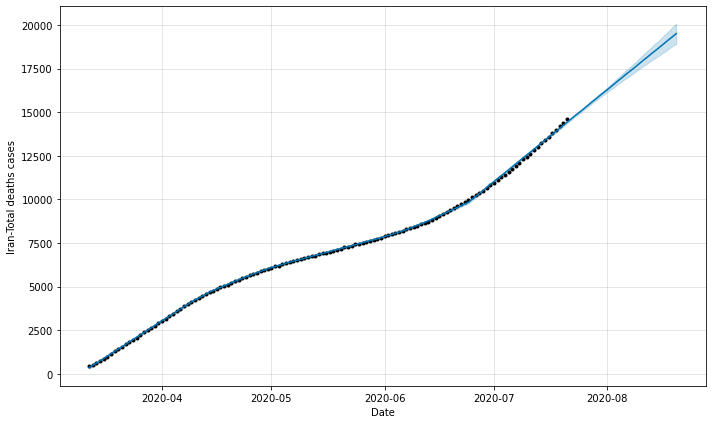

In [71]:
#most_affected5=['US','Brazil','India','Russia','Peru','Iran']

def country_df(i):
    df=covid19_date_country[covid19_date_country['Country/Region'] == most_affected5[i]].iloc[50:,:]
    return df

k=0
for j in most_affected5:
    data = pd.DataFrame(columns = ['ds','y'])
    data['ds'] = covid19_world['Date'][50:]
    data['y'] = country_df(k)['Deaths'].values

    prop=Prophet()
    prop.fit(data)
    future=prop.make_future_dataframe(periods=30)
    prop_forecast=prop.predict(future)
    forecast = prop_forecast[['ds','yhat']].tail(30)

    fig = plot_plotly(prop, prop_forecast)
    fig = prop.plot(prop_forecast,xlabel='Date',ylabel='%s-Total deaths cases' %(j))
    k=k+1

## Prediction of confirmed cases of Iran using MLP and LSTM-RNN

In [72]:
iran_df=pd.read_csv('covid19_iran.csv')
iran_df=iran_df[['Date','Confirmed']].loc[:]
iran_df.head()

,Date,Confirmed
0,2020-01-22,0
1,2020-01-23,0
2,2020-01-24,0
3,2020-01-25,0
4,2020-01-26,0


In [73]:
len(iran_df)

182

In [74]:
# the size of the validation set (number of steps), i.e taking `n_steps` data points to predict `n_steps+1`th data point
#The batches would be [feed=[t_1,...,t_{n_steps}],predict=tt_{n_steps+1}].

n_steps=10

# training set size
train_size=len(iran_df)-n_steps

# split training and test set
train = iran_df.iloc[:train_size]['Confirmed'].values.reshape(-1,1)
test = iran_df.iloc[train_size:]['Confirmed'].values.reshape(-1,1)
len(train)

172

In [75]:
# scaling the data since the data is too skewed
normal = MinMaxScaler()

In [76]:
normal_train = normal.fit_transform(train)
normal_test = normal.fit_transform(test)
normal_train[50:56]

array([[0.03949168],
       [0.04454427],
       [0.04989475],
       [0.05463376],
       [0.05876127],
       [0.06337876]])

In [77]:
normal_test

array([[0.        ],
       [0.10913399],
       [0.22625906],
       [0.33720498],
       [0.4533544 ],
       [0.56388218],
       [0.66451403],
       [0.76588924],
       [0.87804311],
       [1.        ]])

### Multilayer Perceptron (MLP)

- Time Series Generator for generating batches for training/validation from a regular time series data.
- These batches will be fed to train the model.
- [How to use it for time series](https://machinelearningmastery.com/how-to-use-the-timeseriesgenerator-for-time-series-forecasting-in-keras/)

In [78]:
from keras.preprocessing.sequence import TimeseriesGenerator

Using TensorFlow backend.


In [79]:
# number of inputs and number of features
n_input = n_steps 
n_features = 1 
generator = TimeseriesGenerator(normal_train,normal_train,length = n_input,batch_size=1)
len(normal_train),len(generator)

(172, 162)

In [80]:
# number of samples
print('Samples: %d' % len(generator))

Samples: 162


In [81]:
for i in range(len(generator)-170,len(generator)):
	x, y = generator[i]
	print('%s => %s' % (x, y))

[] => [[0.]]
[] => [[0.]]
[] => [[0.]]
[] => [[0.]]
[] => [[0.]]
[] => [[0.]]
[] => [[0.]]
[] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [[0.]]
[[[0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]
  [0.]]] => [

In [82]:
# Multilayer Perceptron (MLP) model with one hidden layer containing 210 nodes

from keras.models import Sequential
from keras.layers import Dense, Activation,Flatten

model = Sequential()
model.add(Dense(200, activation='relu',input_shape=(n_input,n_features)))
model.add(Flatten())
model.add(Dense(units=1))
model.compile(optimizer='adam', loss='mse')

In [83]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 10, 200)           400       
_________________________________________________________________
flatten_1 (Flatten)          (None, 2000)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 2001      
Total params: 2,401
Trainable params: 2,401
Non-trainable params: 0
_________________________________________________________________


In [84]:
validation_set = np.append(normal_train[-1],normal_test)
validation_set=validation_set.reshape(11,1)
validation_set

array([[1.        ],
       [0.        ],
       [0.10913399],
       [0.22625906],
       [0.33720498],
       [0.4533544 ],
       [0.56388218],
       [0.66451403],
       [0.76588924],
       [0.87804311],
       [1.        ]])

In [85]:
n_input = 10
n_features = 1
validation_gen = TimeseriesGenerator(validation_set,validation_set,length = n_input,batch_size=1)

In [86]:
from tensorflow.keras.callbacks import EarlyStopping

early_stop = EarlyStopping(monitor='val_loss',patience=20,restore_best_weights=True)

In [87]:
# fit model

model.fit_generator(generator,validation_data=validation_gen,epochs=200,callbacks=[early_stop],steps_per_epoch=10)

Epoch 1/200
10/10 [==============================] - 0s 11ms/step - loss: 0.1005 - val_loss: 0.6294
Epoch 2/200
10/10 [==============================] - 0s 2ms/step - loss: 0.0641 - val_loss: 0.2598
Epoch 3/200
10/10 [==============================] - 0s 7ms/step - loss: 0.0099 - val_loss: 0.1459
Epoch 4/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0080 - val_loss: 0.2244
Epoch 5/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0020 - val_loss: 0.2906
Epoch 6/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0029 - val_loss: 0.2638
Epoch 7/200
10/10 [==============================] - 0s 10ms/step - loss: 5.1356e-04 - val_loss: 0.2338
Epoch 8/200
10/10 [==============================] - 0s 10ms/step - loss: 4.3519e-04 - val_loss: 0.2366
Epoch 9/200
10/10 [==============================] - 0s 10ms/step - loss: 3.4900e-04 - val_loss: 0.2475
Epoch 10/200
10/10 [==============================] - 0s 10ms/step - loss: 4.7536e-04 - va

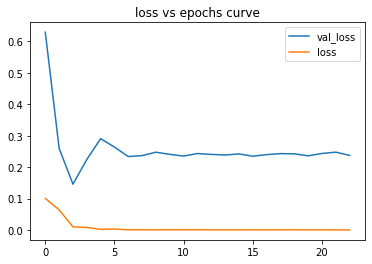

In [88]:
pd.DataFrame(model.history.history).plot(title="loss vs epochs curve")

In [89]:
model.history.history.keys()

dict_keys(['val_loss', 'loss'])

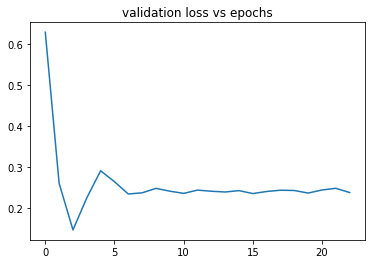

In [90]:
loss_1 = model.history.history["val_loss"]
plt.title("validation loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

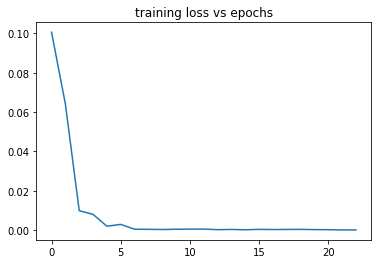

In [91]:
loss_1 = model.history.history["loss"]
plt.title("training loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

In [92]:
# list of predictions
test_prediction = []

#last `n_input` points from training set
current_batch = normal_train[-n_input:].reshape(1,n_input,n_features)

In [93]:
current_batch.shape

(1, 10, 1)

In [94]:
# forecast the number of confirmed cases in Iran for validation set and the next 7 days

for i in range(len(test)+7):
    current_pred = model.predict(current_batch)[0]
    test_prediction.append(current_pred)
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [95]:
test_prediction

[array([1.1302767], dtype=float32),
 array([1.1560886], dtype=float32),
 array([1.1749527], dtype=float32),
 array([1.198183], dtype=float32),
 array([1.2206684], dtype=float32),
 array([1.2442793], dtype=float32),
 array([1.2743888], dtype=float32),
 array([1.3006275], dtype=float32),
 array([1.3427635], dtype=float32),
 array([1.3821357], dtype=float32),
 array([1.4213673], dtype=float32),
 array([1.4507567], dtype=float32),
 array([1.479944], dtype=float32),
 array([1.5101682], dtype=float32),
 array([1.5423768], dtype=float32),
 array([1.5750926], dtype=float32),
 array([1.6104115], dtype=float32)]

In [96]:
# apply inverse transformations on scaled data
true_prediction = normal.inverse_transform(test_prediction)
true_prediction[:,0]

array([281631.07526016, 282186.65082455, 282592.6828928 , 283092.68961096,
       283576.66739702, 284084.86690855, 284732.94431877, 285297.70566463,
       286204.64250231, 287052.08985853, 287896.50949907, 288529.08654451,
       289157.31445599, 289807.86022425, 290501.11731052, 291205.29213428,
       291965.49765921])

In [97]:
# number of days in future considered to forecast
future_days = 7

# first date of test
first_date = iran_df.iloc[train_size:]['Date'].tolist()[0]
first_date=pd.to_datetime(first_date)
print(type(first_date))
# find dates related to days from start of test set to future
dates_first_to_futures = pd.Series([(first_date + timedelta(days=i)) for i in range(17)])
print(dates_first_to_futures.shape)

<class 'pandas._libs.tslibs.timestamps.Timestamp'>
(17,)


In [98]:
prediction_df = pd.DataFrame(columns=["confirmed","confirmed_predicted"],index=dates_first_to_futures)
prediction_df

,confirmed,confirmed_predicted
2020-07-12,NaN,NaN
2020-07-13,NaN,NaN
2020-07-14,NaN,NaN
2020-07-15,NaN,NaN
2020-07-16,NaN,NaN
2020-07-17,NaN,NaN
2020-07-18,NaN,NaN
2020-07-19,NaN,NaN
2020-07-20,NaN,NaN
2020-07-21,NaN,NaN


In [99]:
prediction_df.loc[:,"confirmed_predicted"] = true_prediction[:,0]
test_set=iran_df.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df.loc[:len(test),"confirmed"] = iran_df.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df

,confirmed,confirmed_predicted
2020-07-12,257303,281631.075260
2020-07-13,259652,282186.650825
2020-07-14,262173,282592.682893
2020-07-15,264561,283092.689611
2020-07-16,267061,283576.667397
2020-07-17,269440,284084.866909
2020-07-18,271606,284732.944319
2020-07-19,273788,285297.705665
2020-07-20,276202,286204.642502
2020-07-21,278827,287052.089859


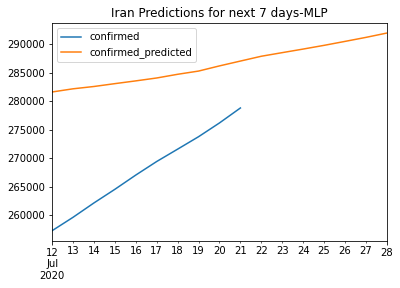

In [100]:
prediction_df.plot(title="Iran Predictions for next 7 days-MLP")

In [101]:
from keras.models import load_model
name = "models/confirmed_iran.h5".format(country,str(datetime.now()).split()[0])

### A recurrent neural network, Long Short-Term Memory network (LSTM)

In [102]:
# number of inputs and number of features
n_input = n_steps 
n_features = 1 
generator = TimeseriesGenerator(normal_train,normal_train,length = n_input,batch_size=1)
len(normal_train),len(generator)

(172, 162)

In [103]:
# number of samples
print('Samples: %d' % len(generator))

Samples: 162


In [104]:
# A recurrent neural network (LSTM) model with two hidden layers containing 150+75 nodes

#from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Activation

model = Sequential()
model.add(LSTM(150,activation="relu",input_shape=(n_input,n_features)))
#model.add(Dropout(0.2))
model.add(Dense(75, activation='relu'))
#model.add(Dense(10, activation='relu'))
model.add(Dense(units=1))
#model.add(Activation('softmax'))
#model.add(Dense(1))
model.compile(optimizer="adam",loss="mse")

In [105]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 150)               91200     
_________________________________________________________________
dense_3 (Dense)              (None, 75)                11325     
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 76        
Total params: 102,601
Trainable params: 102,601
Non-trainable params: 0
_________________________________________________________________


In [106]:
validation_set = np.append(normal_train[-1],normal_test)
validation_set=validation_set.reshape(11,1)
validation_set

array([[1.        ],
       [0.        ],
       [0.10913399],
       [0.22625906],
       [0.33720498],
       [0.4533544 ],
       [0.56388218],
       [0.66451403],
       [0.76588924],
       [0.87804311],
       [1.        ]])

In [107]:
n_input = 10
n_features = 1
validation_gen = TimeseriesGenerator(validation_set,validation_set,length = n_input,batch_size=1)

In [108]:
# fit model
model.fit_generator(generator,validation_data=validation_gen,epochs=200,callbacks=[early_stop],steps_per_epoch=10)
#model.fit_generator(generator,validation_data=validation_gen,epochs=500,callbacks=[early_stop],steps_per_epoch=1)

Epoch 1/200
10/10 [==============================] - 0s 39ms/step - loss: 0.1754 - val_loss: 0.6431
Epoch 2/200
10/10 [==============================] - 0s 7ms/step - loss: 0.0290 - val_loss: 0.3241
Epoch 3/200
10/10 [==============================] - 0s 7ms/step - loss: 0.0099 - val_loss: 0.1516
Epoch 4/200
10/10 [==============================] - 0s 7ms/step - loss: 0.0048 - val_loss: 0.2856
Epoch 5/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0083 - val_loss: 0.1154
Epoch 6/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0034 - val_loss: 0.2470
Epoch 7/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0016 - val_loss: 0.1961
Epoch 8/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0037 - val_loss: 0.2137
Epoch 9/200
10/10 [==============================] - 0s 10ms/step - loss: 0.0026 - val_loss: 0.2056
Epoch 10/200
10/10 [==============================] - 0s 10ms/step - loss: 9.2718e-04 - val_loss: 0.250

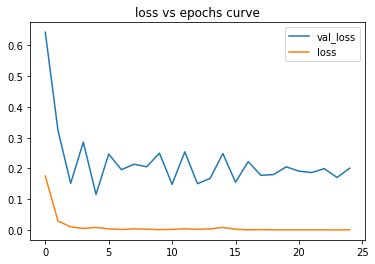

In [109]:
pd.DataFrame(model.history.history).plot(title="loss vs epochs curve")

In [110]:
model.history.history.keys()

dict_keys(['val_loss', 'loss'])

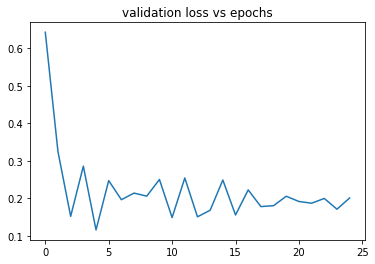

In [111]:
loss_1 = model.history.history["val_loss"]
plt.title("validation loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

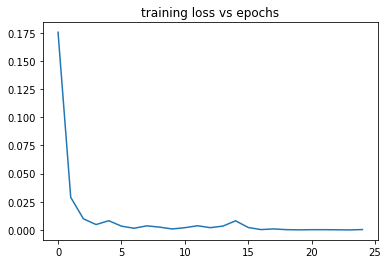

In [112]:
loss_1 = model.history.history["loss"]
plt.title("training loss vs epochs")
plt.plot(range(len(loss_1)),loss_1)

In [113]:
# list of predictions
test_prediction = []

#last `n_input` points from training set
current_batch = normal_train[-n_input:].reshape(1,n_input,n_features)

In [114]:
current_batch.shape

(1, 10, 1)

In [115]:
# forecast the number of confirmed cases in Iran for validation set and the next 7 days

for i in range(len(test)+7):
    current_pred = model.predict(current_batch)[0]
    test_prediction.append(current_pred)
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

In [116]:
test_prediction

[array([1.248004], dtype=float32),
 array([1.2994058], dtype=float32),
 array([1.3589737], dtype=float32),
 array([1.4282107], dtype=float32),
 array([1.5089929], dtype=float32),
 array([1.6022407], dtype=float32),
 array([1.7109493], dtype=float32),
 array([1.8402885], dtype=float32),
 array([1.9957261], dtype=float32),
 array([2.1848824], dtype=float32),
 array([2.4172783], dtype=float32),
 array([2.6626384], dtype=float32),
 array([2.966976], dtype=float32),
 array([3.35089], dtype=float32),
 array([3.8468199], dtype=float32),
 array([4.507021], dtype=float32),
 array([5.416122], dtype=float32)]

In [117]:
# apply inverse transformations on scaled data
true_prediction = normal.inverse_transform(test_prediction)
true_prediction[:,0]

array([284165.03722763, 285271.41072369, 286553.55081272, 288043.80786705,
       289782.56340313, 291789.6284318 , 294129.47277021, 296913.37010145,
       300259.00876045, 304330.40882969, 309332.49790955, 314613.6294775 ,
       321164.18986034, 329427.55466366, 340101.95104599, 354312.11893463,
       373879.60906029])

In [118]:
# number of days in future considered to forecast
future_days = 7

# first date of test
first_date = iran_df.iloc[train_size:]['Date'].tolist()[0]
first_date=pd.to_datetime(first_date)
print(type(first_date))
# find dates related to days from start of test set to future
dates_first_to_futures = pd.Series([(first_date + timedelta(days=i)) for i in range(17)])
print(dates_first_to_futures.shape)

<class 'pandas._libs.tslibs.timestamps.Timestamp'>
(17,)


In [119]:
prediction_df = pd.DataFrame(columns=["confirmed","confirmed_predicted"],index=dates_first_to_futures)
prediction_df

,confirmed,confirmed_predicted
2020-07-12,NaN,NaN
2020-07-13,NaN,NaN
2020-07-14,NaN,NaN
2020-07-15,NaN,NaN
2020-07-16,NaN,NaN
2020-07-17,NaN,NaN
2020-07-18,NaN,NaN
2020-07-19,NaN,NaN
2020-07-20,NaN,NaN
2020-07-21,NaN,NaN


In [120]:
prediction_df.loc[:,"confirmed_predicted"] = true_prediction[:,0]
test_set=iran_df.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df.loc[:len(test),"confirmed"] = iran_df.iloc[train_size:]['Confirmed'].values.tolist()
prediction_df

,confirmed,confirmed_predicted
2020-07-12,257303,284165.037228
2020-07-13,259652,285271.410724
2020-07-14,262173,286553.550813
2020-07-15,264561,288043.807867
2020-07-16,267061,289782.563403
2020-07-17,269440,291789.628432
2020-07-18,271606,294129.472770
2020-07-19,273788,296913.370101
2020-07-20,276202,300259.008760
2020-07-21,278827,304330.408830


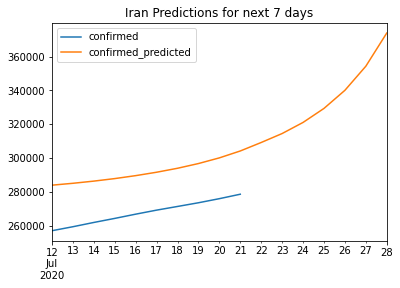

In [121]:
prediction_df.plot(title="Iran Predictions for next 7 days")

# Data modelling and prediction based on dataframes (multivariate time series)

## Predicting the total number of confirmed cases of the world

In [122]:
data = covid19_world.copy().drop(['Date'],axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182 entries, 0 to 181
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Confirmed                182 non-null    int64  
 1   Deaths                   182 non-null    int64  
 2   Recovered                182 non-null    int64  
 3   Active                   182 non-null    int64  
 4   New confirmed            182 non-null    int64  
 5   New deaths               182 non-null    int64  
 6   New recovered            182 non-null    int64  
 7   Recovery rate(per 100)   182 non-null    float64
 8   Mortality rate(per 100)  182 non-null    float64
 9   Number of countries      182 non-null    int64  
dtypes: float64(2), int64(8)
memory usage: 14.3 KB


In [123]:
data.describe()

,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),Number of countries
count,1.820000e+02,182.000000,1.820000e+02,1.820000e+02,182.000000,182.000000,182.000000,182.000000,182.000000,182.000000
mean,4.024281e+06,217255.928571,1.830519e+06,1.976506e+06,82237.697802,3386.873626,45828.214286,33.522198,4.892637,142.895604
std,4.341722e+06,208108.629051,2.332767e+06,1.855740e+06,69872.168827,2505.927783,50959.151275,15.899876,1.600865,65.845165
min,5.550000e+02,17.000000,2.800000e+01,5.100000e+02,0.000000,0.000000,0.000000,1.710000,2.040000,6.000000
25%,1.062908e+05,3614.000000,5.717300e+04,5.775225e+04,4817.750000,216.250000,2453.750000,22.320000,3.450000,95.250000
50%,2.591061e+06,184500.500000,6.762040e+05,1.730356e+06,80182.000000,3958.500000,28566.000000,34.595000,4.945000,184.000000
75%,6.850280e+06,399905.750000,3.000730e+06,3.449645e+06,123650.500000,5311.000000,75449.750000,47.877500,6.375000,187.000000
max,1.494671e+07,616428.000000,8.340763e+06,5.989516e+06,252533.000000,8890.000000,284368.000000,55.800000,7.190000,187.000000


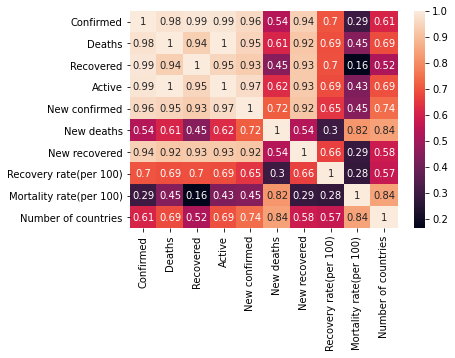

In [124]:
# Correlations

sns.heatmap(data.corr(), annot = True)

In [125]:
X=data.iloc[:,1:].values
y=data.iloc[:,0].values

In [126]:
#Splitting the dataset related to confirmed cases of the world into training and test sets

X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(X, y,test_size = 0.2,random_state=42)

print(X_train_confirmed.shape)
print(y_train_confirmed.shape)
print(X_test_confirmed.shape)
print(y_test_confirmed.shape)

(145, 9)
(145,)
(37, 9)
(37,)


### Decision tree regressor

RMSE of  DecisionTreeRegressor 123831.84
MAE of  DecisionTreeRegressor 90909.49 



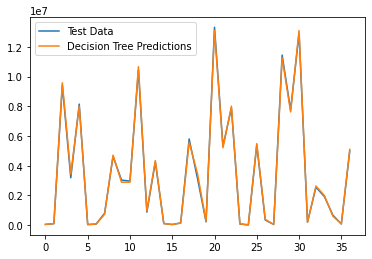

In [127]:
tree_reg = DecisionTreeRegressor(max_depth=8, random_state=42)

tree_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = tree_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'Decision Tree Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", tree_reg.__class__.__name__, round(rmse,2))
print("MAE of ", tree_reg.__class__.__name__, round(mae,2), '\n')

### Support vector machine regressor

RMSE of  SVR 3243904.74
MAE of  SVR 2741599.41 



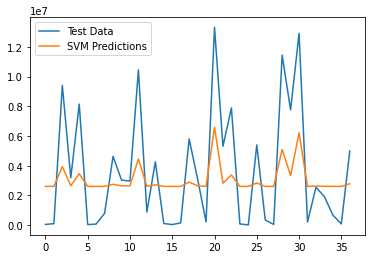

In [128]:
svm_reg = SVR(C=1000,kernel='poly')
svm_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = svm_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

RMSE of  SVR 1371537.06
MAE of  SVR 1294629.74 



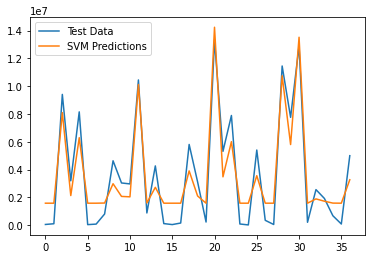

In [129]:
svm_reg = SVR(C=100000,kernel='poly')
svm_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = svm_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

RMSE of  SVR 805351.92
MAE of  SVR 672079.53 



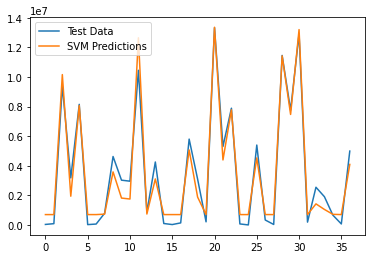

In [130]:
svm_reg = SVR(C=1000000,kernel='poly')
svm_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = svm_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

### Random Forests Regressor

RMSE of  RandomForestRegressor 57678.2
MAE of  RandomForestRegressor 37034.1 



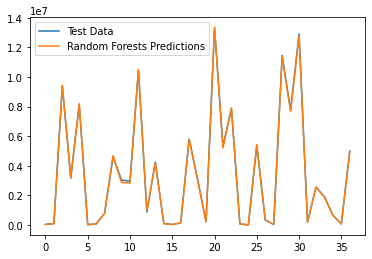

In [131]:
rf_reg = RandomForestRegressor(max_depth=9,n_estimators=5000, random_state=42)

rf_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = rf_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'Random Forests Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", rf_reg.__class__.__name__, round(rmse,2))
print("MAE of ", rf_reg.__class__.__name__, round(mae,2), '\n')

### XGBoost Regressor

In [132]:
xgb_reg=XGBRegressor(n_estimators=1000, learning_rate=0.05, n_jobs=4)
xgb_reg.fit(X_train_confirmed, y_train_confirmed, early_stopping_rounds=10,
            eval_set=[(X_test_confirmed, y_test_confirmed)],verbose=0)

[16:19:47] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=4, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

RMSE of  XGBRegressor 106252.42
MAE of  XGBRegressor 79751.62 



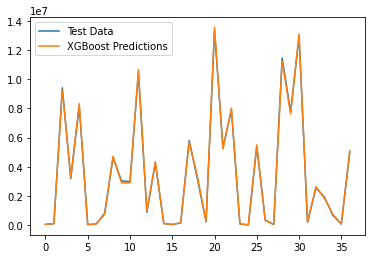

In [133]:
xgb_reg= XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1,
             n_estimators=1000, n_jobs=4, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=0)

xgb_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = xgb_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'XGBoost Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", xgb_reg.__class__.__name__, round(rmse,2))
print("MAE of ", xgb_reg.__class__.__name__, round(mae,2), '\n')

## Add some new columns to data

In [134]:
data['Day'] = covid19_world['Date'].dt.day
data['Month'] = covid19_world['Date'].dt.month
data['Day of week'] = covid19_world['Date'].dt.dayofweek
data['Day of year'] = covid19_world['Date'].dt.dayofyear
data['Quarter'] = covid19_world['Date'].dt.quarter
data['Week of year'] = covid19_world['Date'].dt.weekofyear

In [135]:
data.head()

,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),Number of countries,Day,Month,Day of week,Day of year,Quarter,Week of year
0,555,17,28,510,0,0,0,5.05,3.06,6,22,1,2,22,1,4
1,654,18,30,606,99,1,2,4.59,2.75,8,23,1,3,23,1,4
2,941,26,36,879,287,8,6,3.83,2.76,9,24,1,4,24,1,4
3,1434,42,39,1353,493,16,3,2.72,2.93,11,25,1,5,25,1,4
4,2118,56,52,2010,684,14,13,2.46,2.64,13,26,1,6,26,1,4


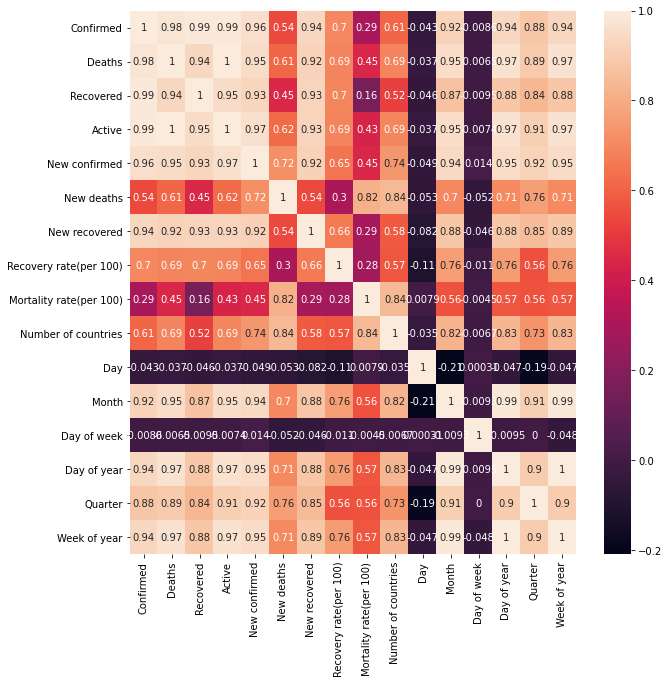

In [136]:
# Correlations
plt.figure(figsize= (10,10))
sns.heatmap(data.corr(), annot = True)

In [137]:
# drop some columns based on correlations

data=data.drop(['Day','Day of week'],axis=1)
data.head()

,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),Number of countries,Month,Day of year,Quarter,Week of year
0,555,17,28,510,0,0,0,5.05,3.06,6,1,22,1,4
1,654,18,30,606,99,1,2,4.59,2.75,8,1,23,1,4
2,941,26,36,879,287,8,6,3.83,2.76,9,1,24,1,4
3,1434,42,39,1353,493,16,3,2.72,2.93,11,1,25,1,4
4,2118,56,52,2010,684,14,13,2.46,2.64,13,1,26,1,4


In [138]:
X=data.iloc[:,1:].values
y=data.iloc[:,0].values

In [139]:
#Splitting the dataset related to confirmed cases of the world into training and test sets

X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(X, y,test_size = 0.2,random_state=42)

print(X_train_confirmed.shape)
print(y_train_confirmed.shape)
print(X_test_confirmed.shape)
print(y_test_confirmed.shape)

(145, 13)
(145,)
(37, 13)
(37,)


#### Decision tree regressor

RMSE of  DecisionTreeRegressor 125950.5
MAE of  DecisionTreeRegressor 99727.77 



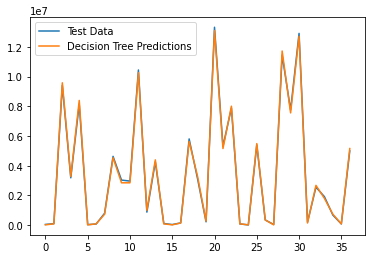

In [140]:
tree_reg = DecisionTreeRegressor(max_depth=6, random_state=42)

tree_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = tree_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'Decision Tree Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", tree_reg.__class__.__name__, round(rmse,2))
print("MAE of ", tree_reg.__class__.__name__, round(mae,2), '\n')

#### Support vector machine regressor

RMSE of  SVR 3339835.15
MAE of  SVR 2794670.16 



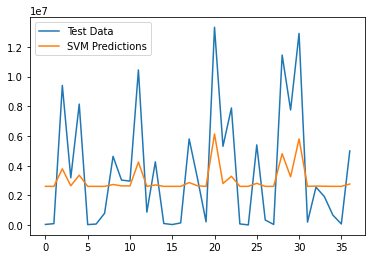

In [141]:
svm_reg = SVR(C=1000,kernel='poly')
svm_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = svm_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

RMSE of  SVR 819024.68
MAE of  SVR 714053.45 



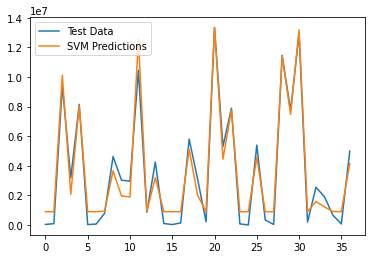

In [142]:
svm_reg = SVR(C=1000000,kernel='poly')
svm_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = svm_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'SVM Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", svm_reg.__class__.__name__, round(rmse,2))
print("MAE of ", svm_reg.__class__.__name__, round(mae,2), '\n')

#### Random Forests Regressor

RMSE of  RandomForestRegressor 57425.63
MAE of  RandomForestRegressor 33329.95 



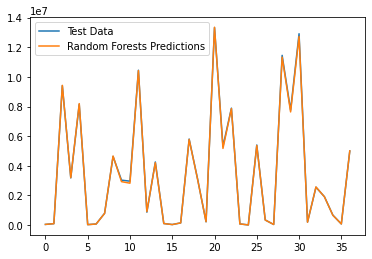

In [143]:
rf_reg = RandomForestRegressor(max_depth=8,n_estimators=5000, random_state=42)

rf_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = rf_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'Random Forests Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", rf_reg.__class__.__name__, round(rmse,2))
print("MAE of ", rf_reg.__class__.__name__, round(mae,2), '\n')

#### XGBoost Regressor

In [144]:
xgb_reg=XGBRegressor(n_estimators=1000, learning_rate=0.05, n_jobs=4)
xgb_reg.fit(X_train_confirmed, y_train_confirmed, early_stopping_rounds=10,
            eval_set=[(X_test_confirmed, y_test_confirmed)],verbose=0)

[16:19:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.05, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1000,
             n_jobs=4, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)

RMSE of  XGBRegressor 106252.42
MAE of  XGBRegressor 79751.62 



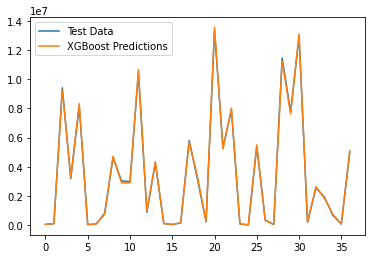

In [145]:
xgb_reg=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.05, max_delta_step=0, max_depth=6,
             min_child_weight=1,
             n_estimators=1000, n_jobs=4, num_parallel_tree=1,
             objective='reg:squarederror', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=0)

xgb_reg.fit(X_train_confirmed, y_train_confirmed)

y_pred = xgb_reg.predict(X_test_confirmed)

plt.plot(y_test_confirmed)
plt.plot(y_pred)
plt.legend(['Test Data', 'XGBoost Predictions'])

mae=mean_absolute_error(y_pred, y_test_confirmed)
mse=mean_squared_error(y_pred, y_test_confirmed)
rmse = np.sqrt(mse)
print("RMSE of ", xgb_reg.__class__.__name__, round(rmse,2))
print("MAE of ", xgb_reg.__class__.__name__, round(mae,2), '\n')

## Predicting the total number of confirmed cases of the world after addition of some new features

In [146]:
data = covid19_country_latest.copy()
data.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),WHO region
0,Afghanistan,35615,1186,23741,10688,89,1,0,66.66,3.33,EMRO
1,Albania,4290,117,2397,1776,119,4,45,55.87,2.73,EURO
2,Algeria,24278,1100,16646,6532,587,13,246,68.56,4.53,AFRO
3,Andorra,884,52,803,29,0,0,0,90.84,5.88,EURO
4,Angola,779,30,221,528,30,1,0,28.37,3.85,AFRO


In [147]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country/Region           187 non-null    object 
 1   Confirmed                187 non-null    int64  
 2   Deaths                   187 non-null    int64  
 3   Recovered                187 non-null    int64  
 4   Active                   187 non-null    int64  
 5   New confirmed            187 non-null    int64  
 6   New deaths               187 non-null    int64  
 7   New recovered            187 non-null    int64  
 8   Recovery rate(per 100)   187 non-null    float64
 9   Mortality rate(per 100)  187 non-null    float64
 10  WHO region               187 non-null    object 
dtypes: float64(2), int64(7), object(2)
memory usage: 16.2+ KB


In [148]:
data.describe()

,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100)
count,1.870000e+02,187.000000,1.870000e+02,1.870000e+02,187.000000,187.000000,187.000000,187.000000,187.000000
mean,7.992891e+04,3296.406417,4.460301e+04,3.202950e+04,1281.652406,35.021390,942.229947,61.937968,3.098182
std,3.443002e+05,13424.218754,1.634841e+05,1.956151e+05,6282.743187,155.290465,4155.344093,28.026086,3.477414
min,1.000000e+01,0.000000,0.000000e+00,0.000000e+00,0.000000,-12.000000,-113.000000,0.000000,0.000000
25%,1.057000e+03,17.500000,4.330000e+02,1.185000e+02,1.500000,0.000000,0.000000,46.770000,0.990000
50%,5.027000e+03,93.000000,2.307000e+03,1.525000e+03,47.000000,0.000000,12.000000,66.690000,2.130000
75%,3.755850e+04,708.500000,1.997000e+04,8.826000e+03,396.000000,5.500000,247.000000,86.830000,3.835000
max,3.899211e+06,141995.000000,1.555339e+06,2.575198e+06,64534.000000,1367.000000,41039.000000,100.000000,27.990000


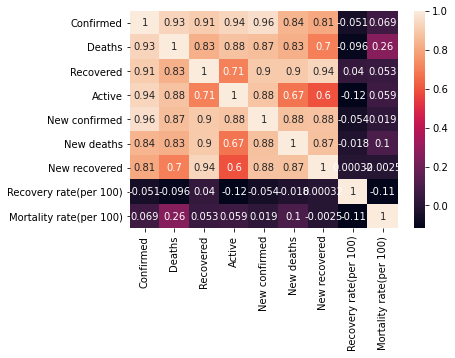

In [149]:
# Correlations

sns.heatmap(data.corr(), annot = True)

### Add new features related to happiness in life to the dataframe

In [150]:
data1=data.copy()

happiness_df = pd.read_csv(path+"/happiness.csv")
happiness_df.head()#/content/happiness.csv

,Overall rank,Country or region,Score,GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
0,1,Finland,7.769,1.340,1.587,0.986,0.596,0.153,0.393
1,2,Denmark,7.600,1.383,1.573,0.996,0.592,0.252,0.410
2,3,Norway,7.554,1.488,1.582,1.028,0.603,0.271,0.341
3,4,Iceland,7.494,1.380,1.624,1.026,0.591,0.354,0.118
4,5,Netherlands,7.488,1.396,1.522,0.999,0.557,0.322,0.298


In [151]:
happiness_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156 entries, 0 to 155
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Overall rank                  156 non-null    int64  
 1   Country or region             156 non-null    object 
 2   Score                         156 non-null    float64
 3   GDP per capita                156 non-null    float64
 4   Social support                156 non-null    float64
 5   Healthy life expectancy       156 non-null    float64
 6   Freedom to make life choices  156 non-null    float64
 7   Generosity                    156 non-null    float64
 8   Perceptions of corruption     156 non-null    float64
dtypes: float64(7), int64(1), object(1)
memory usage: 11.1+ KB


In [152]:
happiness_df1 = happiness_df[['Country or region', 'Healthy life expectancy']]

data1 = data1.merge(happiness_df1, left_on='Country/Region', right_on='Country or region').drop(['Country or region'],axis=1)
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 144 entries, 0 to 143
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country/Region           144 non-null    object 
 1   Confirmed                144 non-null    int64  
 2   Deaths                   144 non-null    int64  
 3   Recovered                144 non-null    int64  
 4   Active                   144 non-null    int64  
 5   New confirmed            144 non-null    int64  
 6   New deaths               144 non-null    int64  
 7   New recovered            144 non-null    int64  
 8   Recovery rate(per 100)   144 non-null    float64
 9   Mortality rate(per 100)  144 non-null    float64
 10  WHO region               144 non-null    object 
 11  Healthy life expectancy  144 non-null    float64
dtypes: float64(3), int64(7), object(2)
memory usage: 14.6+ KB


In [153]:
data1.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),WHO region,Healthy life expectancy
0,Afghanistan,35615,1186,23741,10688,89,1,0,66.66,3.33,EMRO,0.361
1,Albania,4290,117,2397,1776,119,4,45,55.87,2.73,EURO,0.874
2,Algeria,24278,1100,16646,6532,587,13,246,68.56,4.53,AFRO,0.785
3,Argentina,136118,2490,58598,75030,5344,117,2685,43.05,1.83,PAHO,0.881
4,Armenia,35254,662,24206,10386,273,12,704,68.66,1.88,EURO,0.815


In [154]:
px.scatter(data1, y='Mortality rate(per 100)', x='Healthy life expectancy', color='WHO region', hover_data=['Country/Region'])

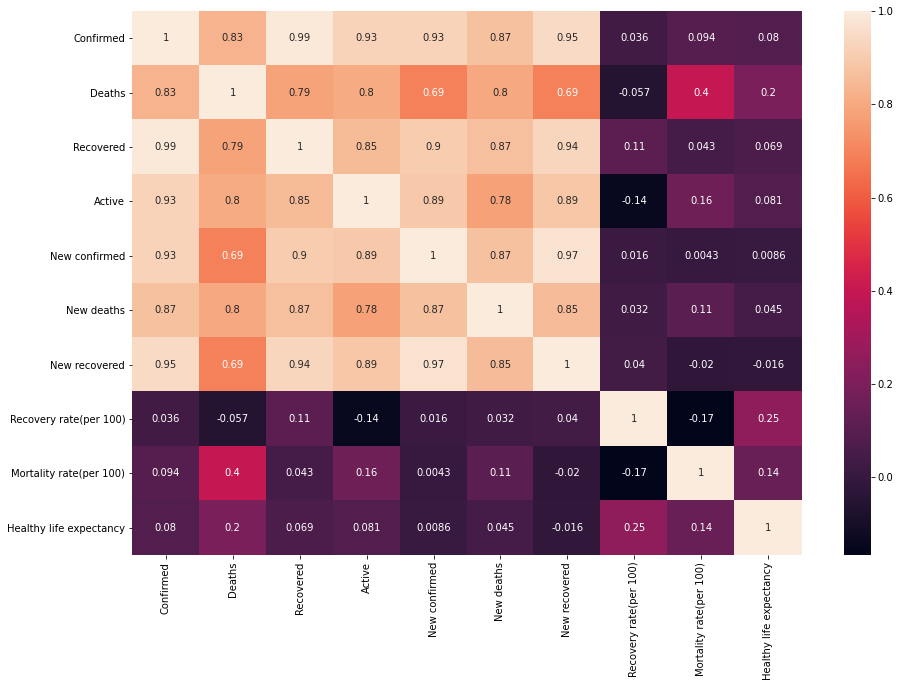

In [155]:
# Correlations
plt.figure(figsize= (15,10))
sns.heatmap(data1.corr(), annot = True)

**Conclusion:**
By the correlations above, it seems that the correlation between 'Healthy life expectancy' and 'Confirmed', 'Deaths', 'Recovered', 'Active','Recovery rate(per 100)'or 'Mortality rate(per 100)' is weak. So, such an addition may not help us in increasing the accuracy of predictions.

In [156]:
data1=data.copy()

In [157]:
happiness_df1 = happiness_df.drop(['Healthy life expectancy'],axis=1)

data1 = data1.merge(happiness_df1, left_on='Country/Region', right_on='Country or region').drop(['Country or region'],axis=1)
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 144 entries, 0 to 143
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country/Region                144 non-null    object 
 1   Confirmed                     144 non-null    int64  
 2   Deaths                        144 non-null    int64  
 3   Recovered                     144 non-null    int64  
 4   Active                        144 non-null    int64  
 5   New confirmed                 144 non-null    int64  
 6   New deaths                    144 non-null    int64  
 7   New recovered                 144 non-null    int64  
 8   Recovery rate(per 100)        144 non-null    float64
 9   Mortality rate(per 100)       144 non-null    float64
 10  WHO region                    144 non-null    object 
 11  Overall rank                  144 non-null    int64  
 12  Score                         144 non-null    float64
 13  GDP p

In [158]:
data1.head()

,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),WHO region,Overall rank,Score,GDP per capita,Social support,Freedom to make life choices,Generosity,Perceptions of corruption
0,Afghanistan,35615,1186,23741,10688,89,1,0,66.66,3.33,EMRO,154,3.203,0.350,0.517,0.000,0.158,0.025
1,Albania,4290,117,2397,1776,119,4,45,55.87,2.73,EURO,107,4.719,0.947,0.848,0.383,0.178,0.027
2,Algeria,24278,1100,16646,6532,587,13,246,68.56,4.53,AFRO,88,5.211,1.002,1.160,0.086,0.073,0.114
3,Argentina,136118,2490,58598,75030,5344,117,2685,43.05,1.83,PAHO,47,6.086,1.092,1.432,0.471,0.066,0.050
4,Armenia,35254,662,24206,10386,273,12,704,68.66,1.88,EURO,116,4.559,0.850,1.055,0.283,0.095,0.064


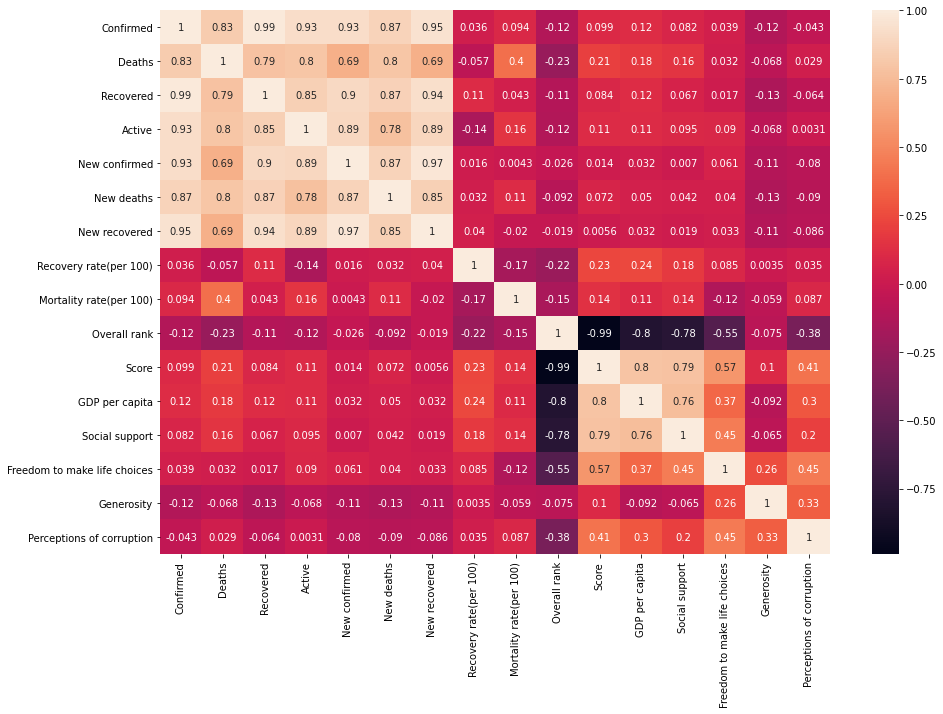

In [159]:
# Correlations
plt.figure(figsize= (15,10))
sns.heatmap(data1.corr(), annot = True)

**Conclusion:**
Similar to the previous case, the correlation between each of the added features and 'Confirmed', 'Deaths', 'Recovered', 'Active','Recovery rate(per 100)'or 'Mortality rate(per 100)' seems to be weak. So, such an addition may not help us in increasing the accuracy of predictions.

### Add new features related to populations to the dataframe

In [160]:
data1=data.copy()

population_df = pd.read_csv(path+"/population_by_country_2020.csv")
population_df.head()

,Country (or dependency),Population (2020),Yearly Change(percent),Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop(percent),World Share(percent)
0,China,1438207241,0.39,5540090,153,9388211,-348399.0,1.7,38,61,18.47
1,India,1377233523,0.99,13586631,464,2973190,-532687.0,2.2,28,35,17.70
2,United States,330610570,0.59,1937734,36,9147420,954806.0,1.8,38,83,4.25
3,Indonesia,272931713,1.07,2898047,151,1811570,-98955.0,2.3,30,56,3.51
4,Pakistan,219992900,2.00,4327022,287,770880,-233379.0,3.6,23,35,2.83


In [161]:
population_df.shape

(235, 11)

In [162]:
population_df1 = population_df[['Country (or dependency)', 'Population (2020)']]

data1 = data1.merge(population_df1, left_on='Country/Region', right_on='Country (or dependency)').drop(['Country (or dependency)'],axis=1)
data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176 entries, 0 to 175
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Country/Region           176 non-null    object 
 1   Confirmed                176 non-null    int64  
 2   Deaths                   176 non-null    int64  
 3   Recovered                176 non-null    int64  
 4   Active                   176 non-null    int64  
 5   New confirmed            176 non-null    int64  
 6   New deaths               176 non-null    int64  
 7   New recovered            176 non-null    int64  
 8   Recovery rate(per 100)   176 non-null    float64
 9   Mortality rate(per 100)  176 non-null    float64
 10  WHO region               176 non-null    object 
 11  Population (2020)        176 non-null    int64  
dtypes: float64(2), int64(8), object(2)
memory usage: 17.9+ KB


In [163]:
data1.head(10)

,Country/Region,Confirmed,Deaths,Recovered,Active,New confirmed,New deaths,New recovered,Recovery rate(per 100),Mortality rate(per 100),WHO region,Population (2020)
0,Afghanistan,35615,1186,23741,10688,89,1,0,66.66,3.33,EMRO,38742911
1,Albania,4290,117,2397,1776,119,4,45,55.87,2.73,EURO,2878420
2,Algeria,24278,1100,16646,6532,587,13,246,68.56,4.53,AFRO,43685618
3,Andorra,884,52,803,29,0,0,0,90.84,5.88,EURO,77240
4,Angola,779,30,221,528,30,1,0,28.37,3.85,AFRO,32644783
5,Antigua and Barbuda,76,3,57,16,0,0,0,75.00,3.95,PAHO,97764
6,Argentina,136118,2490,58598,75030,5344,117,2685,43.05,1.83,PAHO,45111229
7,Armenia,35254,662,24206,10386,273,12,704,68.66,1.88,EURO,2962137
8,Australia,12894,128,8545,4221,466,2,147,66.27,0.99,WPRO,25439164
9,Austria,19827,710,17716,1401,84,-1,57,89.35,3.58,EURO,8996022


In [164]:
# remove countries with very high populations for beter visualization

data2 = data1[data1['Country/Region'].str.contains('China')!=True]
data2 = data2[data2['Country/Region'].str.contains('India')!=True]

px.scatter(data2, y='Mortality rate(per 100)', x='Population (2020)', color='WHO region', hover_data=['Country/Region'])

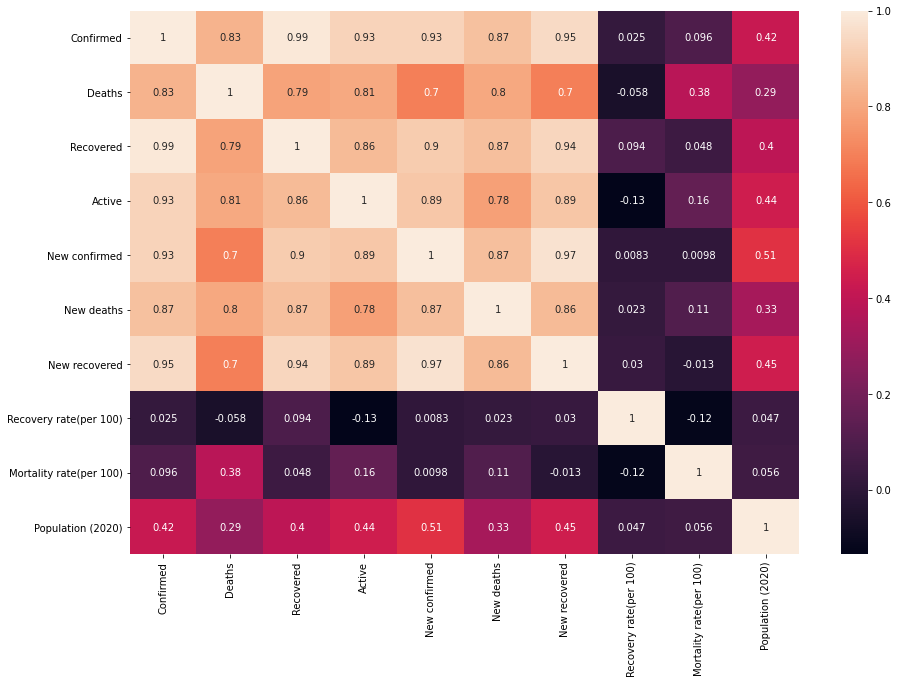

In [165]:
# Correlations
plt.figure(figsize= (15,10))
sns.heatmap(data1.corr(), annot = True)

**Conclusion:**
By the correlations above, it seems that the correlation between 'Population' and 'Confirmed' or 'Active' is moderate (near 0.4). Also, there exists a week correlation between 'Population' and 'Recovery rate(per 100)' or 'Mortality rate(per 100)'.